<a href="https://colab.research.google.com/github/gmvenge/ASDFG/blob/master/MiniDissertation_Finale.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#By T.G Mumvenge - Master of AI Minor Dissertation - University of Johanesburg

#ResNet-50 vs Lightweight Custom CNN for automated waste classification

RealWaste Dataset was used because it resembles landfill waste images. Below i start by cloning the dataset from github.

In [1]:
#Loading and reading the folder that contain images data at the following link https://github.com/sam-single/realwaste/tree/main/RealWaste

!git clone https://github.com/sam-single/realwaste.git

# Navigating to the cloned directory
%cd realwaste

# Navigating to the RealWaste data directory
%cd RealWaste

# Listing the contents of the directory to see the image folders
!ls

Cloning into 'realwaste'...
remote: Enumerating objects: 4782, done.
remote: Counting objects: 100% (18/18), done.
remote: Compressing objects: 100% (13/13), done.
remote: Total 4782 (delta 4), reused 8 (delta 1), pack-reused 4764 (from 1)
Receiving objects: 100% (4782/4782), 655.92 MiB | 28.57 MiB/s, done.
Resolving deltas: 100% (4/4), done.
Updating files: 100% (4754/4754), done.
/content/realwaste
/content/realwaste/RealWaste
 Cardboard	  Glass  'Miscellaneous Trash'	 Plastic	  Vegetation
'Food Organics'   Metal   Paper			'Textile Trash'


In [2]:
import os
import random
from shutil import copy2

import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import PIL
import torch
import torchvision
from torch.utils.data import DataLoader, random_split
from torchvision import datasets, transforms
from tqdm.notebook import tqdm

Checking versions of different libraries that i imported and would be using

In [3]:
print("torch version : ", torch.__version__)
print("torchvision version : ", torchvision.__version__)
print("numpy version : ", np.__version__)
print("matplotlib version : ", matplotlib.__version__)

!python --version

torch version :  2.6.0+cu124
torchvision version :  0.21.0+cu124
numpy version :  2.0.2
matplotlib version :  3.10.0
Python 3.11.13


In [4]:
data_path = '/content/realwaste/RealWaste'

# Checking if the directory exists
if not os.path.exists(data_path):
    print(f"Error: Directory not found at {data_path}")
else:
    # Loading the dataset using ImageFolder
    try:
        dataset = datasets.ImageFolder(root=data_path)

        # Getting the class names and count the images in each class
        class_counts = {}
        for class_name in dataset.classes:
            class_path = os.path.join(data_path, class_name)
            if os.path.isdir(class_path):
                num_images = len(os.listdir(class_path))
                class_counts[class_name] = num_images
                print(f"Class '{class_name}': {num_images} images")
            else:
                print(f"Warning: Directory not found for class '{class_name}' at {class_path}")

    except Exception as e:
        print(f"An error occurred while loading the dataset: {e}")

Class 'Cardboard': 461 images
Class 'Food Organics': 411 images
Class 'Glass': 420 images
Class 'Metal': 790 images
Class 'Miscellaneous Trash': 495 images
Class 'Paper': 500 images
Class 'Plastic': 921 images
Class 'Textile Trash': 318 images
Class 'Vegetation': 436 images


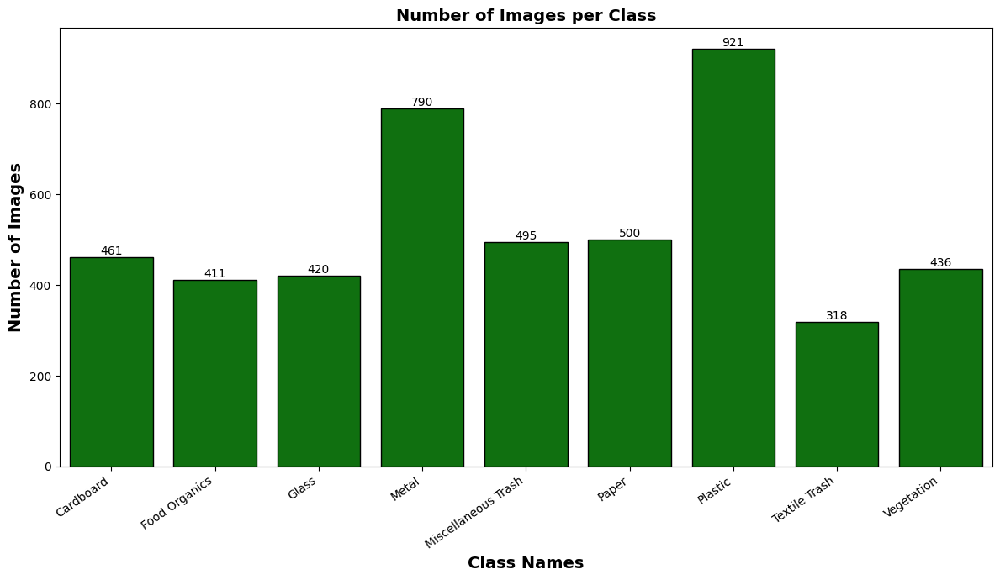

In [5]:
#Plotting the graph and firstly importing Seaborn and Matplot lib
import matplotlib.pyplot as plt
import seaborn as sns

# making a bar graph of the classes using Seaborn
plt.figure(figsize=(12, 7))
ax = sns.barplot(x=list(class_counts.keys()), y=list(class_counts.values()),color='green', edgecolor='black')

# Adding labels on top of the bars
for container in ax.containers:
    ax.bar_label(container)

plt.xlabel('Class Names',fontsize=14, fontweight='bold', color='black')
plt.ylabel('Number of Images', fontsize=14, fontweight='bold', color='black')
plt.title('Number of Images per Class',fontsize=14, fontweight='bold', color='black')
plt.xticks(rotation=35, ha='right')
plt.tight_layout()
plt.show()

In [6]:
def sample_images(data_path, classname):
    # Gets the files in the directory
    class_dir = os.path.join(data_path, classname)
    if not os.path.exists(class_dir):
        return "Invalid directory"
    image_list = os.listdir(class_dir)
    if len(image_list) < 6:
        return "Not enough images in folder"

    # Picking 6 random images of the same class
    images_sample = random.sample(image_list, 6)

    # Plotting them
    plt.figure(figsize=(20, 20))
    for i in range(6):
        img_loc = os.path.join(class_dir, images_sample[i])
        img = PIL.Image.open(img_loc)
        plt.subplot(1, 6, i + 1)
        plt.imshow(img)
        plt.axis("off")

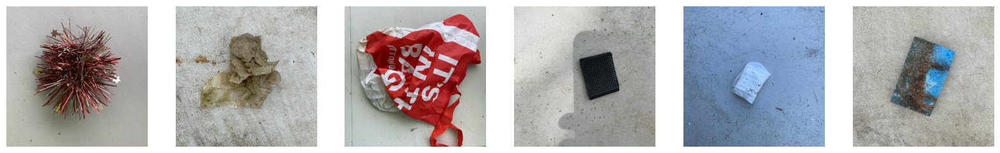

In [7]:
sample_images(data_path, "Miscellaneous Trash")

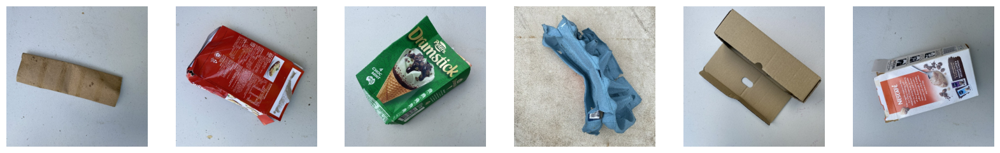

In [8]:
sample_images(data_path, "Cardboard")

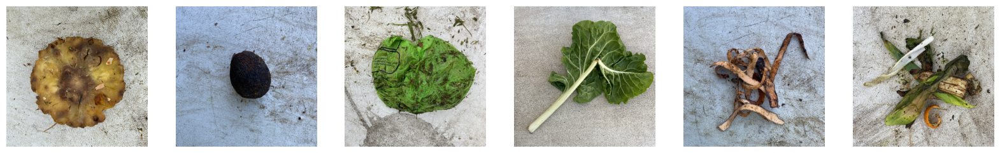

In [9]:
sample_images(data_path, "Food Organics")

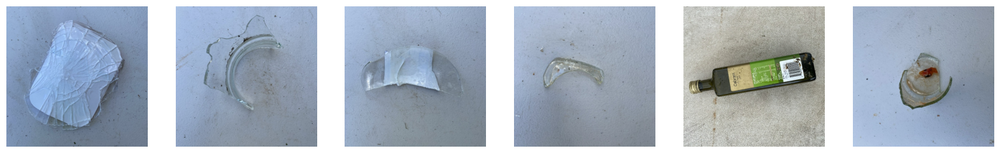

In [10]:
sample_images(data_path, "Glass")

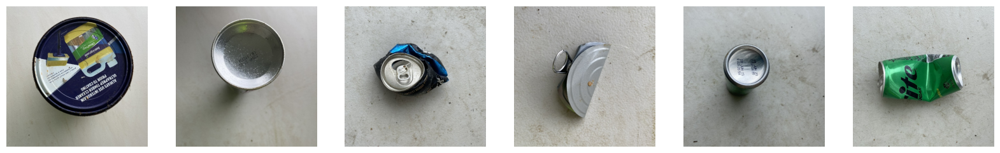

In [11]:
sample_images(data_path, "Metal")

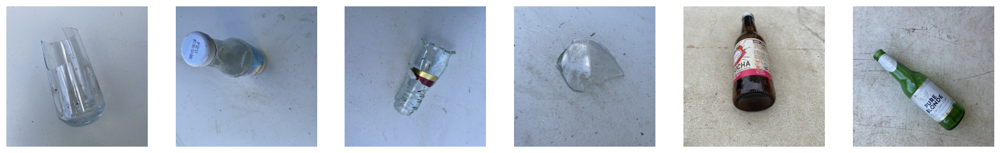

In [12]:
sample_images(data_path, "Glass")

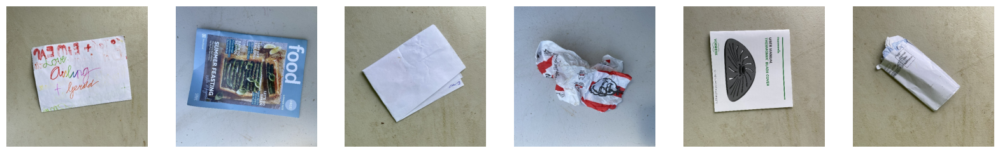

In [13]:
sample_images(data_path, "Paper")

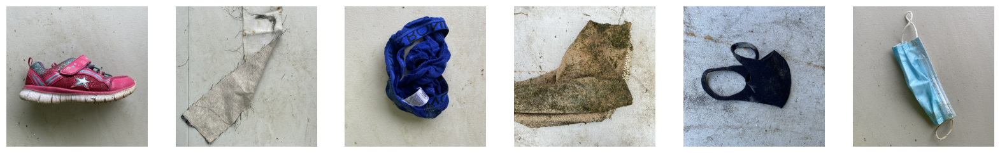

In [14]:
sample_images(data_path, "Textile Trash")

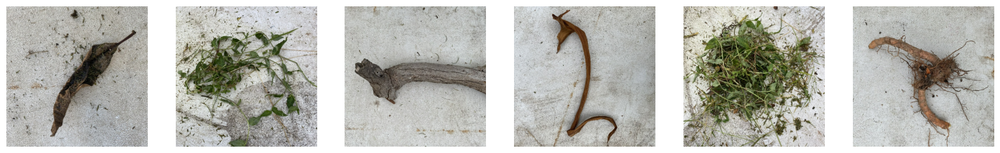

In [15]:
sample_images(data_path, "Vegetation")

Converting grayscale images to RGB

In [16]:
class ConvertToRGB(object):
    def __call__(self, img):
        if img.mode != "RGB":
            img = img.convert("RGB")
        return img

Resize images to  224  x  224
Convert images to PyTorch tensors

In [17]:
transform_basic = transforms.Compose(
    [
        ConvertToRGB(),
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
    ]
)

In [18]:
batch_size = 32
# Loading the full dataset first with the basic transform
full_dataset_with_transform = datasets.ImageFolder(root=data_path, transform=transform_basic)

# Creating the DataLoader from the filtered subset dataset
dataset_loader = DataLoader(full_dataset_with_transform , batch_size=batch_size)

batch_shape = next(iter(dataset_loader))[0].shape
print("Getting batches of shape:", batch_shape)

Getting batches of shape: torch.Size([32, 3, 224, 224])


In [19]:
def get_mean_std(loader):
    """Computes the mean and standard deviation of image data.

    Input: a `DataLoader` producing tensors of shape [batch_size, channels, pixels_x, pixels_y]
    Output: the mean of each channel as a tensor, the standard deviation of each channel as a tensor
            formatted as a tuple (means[channels], std[channels])"""

    channels_sum, channels_squared_sum, num_batches = 0, 0, 0
    for data, _ in tqdm(loader, desc="Computing mean and std", leave=False):
        channels_sum += torch.mean(data, dim=[0, 2, 3])
        channels_squared_sum += torch.mean(data**2, dim=[0, 2, 3])
        num_batches += 1
    mean = channels_sum / num_batches
    std = (channels_squared_sum / num_batches - mean**2) ** 0.5

    return mean, std

In [20]:
mean, std = get_mean_std(dataset_loader)

print(f"Mean: {mean}")
print(f"Standard deviation: {std}")

Computing mean and std:   0%|          | 0/149 [00:00<?, ?it/s]

Mean: tensor([0.5981, 0.6191, 0.6315])
Standard deviation: tensor([0.1611, 0.1619, 0.1854])


In [21]:
transform_norm = transforms.Compose(
    [
        ConvertToRGB(),
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=mean, std=std),
    ]
)

In [22]:
norm_dataset = datasets.ImageFolder(root=data_path, transform = transform_norm)
norm_loader = DataLoader(norm_dataset, batch_size)

batch_shape = next(iter(norm_loader))[0].shape
print("Getting batches of shape:", batch_shape)

Getting batches of shape: torch.Size([32, 3, 224, 224])


In [23]:
norm_mean, norm_std = get_mean_std(norm_loader)

print(f"Mean: {norm_mean}")
print(f"Standard deviation: {norm_std}")

Computing mean and std:   0%|          | 0/149 [00:00<?, ?it/s]

Mean: tensor([ 6.4305e-08, -1.9119e-07, -9.8168e-07])
Standard deviation: tensor([1.0000, 1.0000, 1.0000])


Train and validation splitting

In [24]:
g = torch.Generator()
g.manual_seed(42)

train_dataset, val_dataset = random_split(norm_dataset,[0.8, 0.2], generator=g)

In [25]:
length_train = len(train_dataset)
length_val = len(val_dataset)
length_dataset = len(norm_dataset)
percent_train = np.round(100 * length_train / length_dataset, 1)
percent_val = np.round(100 * length_val / length_dataset, 1)

print(f"Train data is {percent_train}% of full data")
print(f"Validation data is {percent_val}% of full data")

Train data is 80.0% of full data
Validation data is 20.0% of full data


In [26]:
print("Length of training dataset:", len(train_dataset))
print("Length of validation dataset:", len(val_dataset))

Length of training dataset: 3802
Length of validation dataset: 950


Training Dataset Class Counts:
  Cardboard: 370
  Food Organics: 334
  Glass: 332
  Metal: 636
  Miscellaneous Trash: 394
  Paper: 393
  Plastic: 740
  Textile Trash: 262
  Vegetation: 341

Validation Dataset Class Counts:
  Cardboard: 91
  Food Organics: 77
  Glass: 88
  Metal: 154
  Miscellaneous Trash: 101
  Paper: 107
  Plastic: 181
  Textile Trash: 56
  Vegetation: 95


<Figure size 1500x800 with 0 Axes>

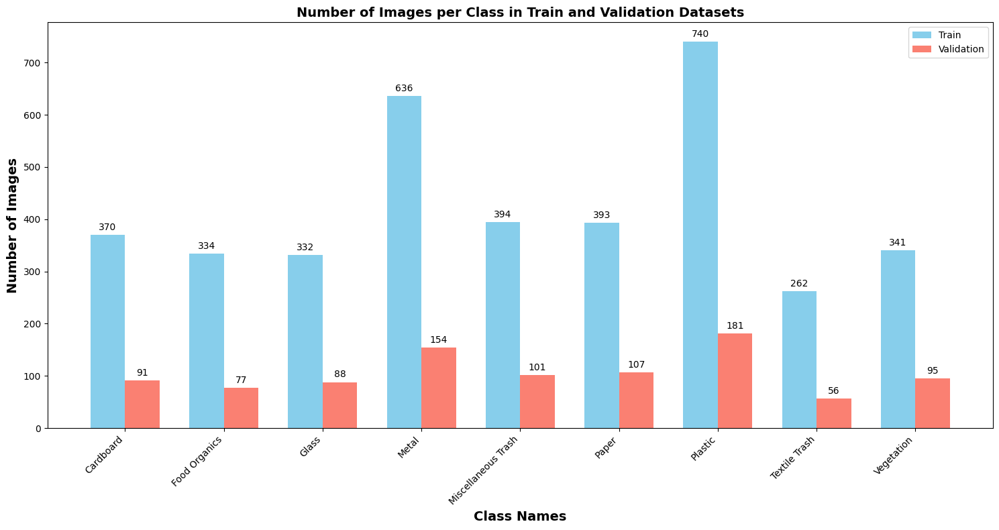

In [27]:
# creating a class_counts to count the number of images in each class in the train dataset and validation dataset.Also plotting the bar graph to show the number of images in each class
# Counting images in the training dataset
train_class_counts = {}
for _, idx in train_dataset:
    class_name = norm_dataset.classes[idx]
    train_class_counts[class_name] = train_class_counts.get(class_name, 0) + 1

# Counting images in the validation dataset
val_class_counts = {}
for _, idx in val_dataset:
    class_name = norm_dataset.classes[idx]
    val_class_counts[class_name] = val_class_counts.get(class_name, 0) + 1

print("Training Dataset Class Counts:")
for class_name, count in sorted(train_class_counts.items()):
    print(f"  {class_name}: {count}")

print("\nValidation Dataset Class Counts:")
for class_name, count in sorted(val_class_counts.items()):
    print(f"  {class_name}: {count}")

# Preparing data for plotting
classes = sorted(list(set(list(train_class_counts.keys()) + list(val_class_counts.keys()))))
train_counts = [train_class_counts.get(cls, 0) for cls in classes]
val_counts = [val_class_counts.get(cls, 0) for cls in classes]

x = np.arange(len(classes))
width = 0.35

plt.figure(figsize=(15, 8))
fig, ax = plt.subplots(figsize=(15, 8))
rects1 = ax.bar(x - width/2, train_counts, width, label='Train', color='skyblue')
rects2 = ax.bar(x + width/2, val_counts, width, label='Validation', color='salmon')

# Adding some text for labels, title and custom x-axis tick labels, etc.
ax.set_xlabel('Class Names', fontsize=14, fontweight='bold', color='black')
ax.set_ylabel('Number of Images', fontsize=14, fontweight='bold', color='black')
ax.set_title('Number of Images per Class in Train and Validation Datasets', fontsize=14, fontweight='bold', color='black')
ax.set_xticks(x)
ax.set_xticklabels(classes, rotation=45, ha='right')
ax.legend()

# Adding labels on top of the bars
def autolabel(rects):
    for rect in rects:
        height = rect.get_height()
        ax.annotate('{}'.format(height),
                    xy=(rect.get_x() + rect.get_width() / 2, height),
                    xytext=(0, 3),  # 3 points vertical offset
                    textcoords="offset points",
                    ha='center', va='bottom')

autolabel(rects1)
autolabel(rects2)

plt.tight_layout()
plt.show()


Perform undersampling to avoid one class influencing the training. Aim is to achieve uniform distribution

In [28]:
def undersample_dataset(dataset_dir, output_dir, target_count=None):
    """
    Undersample the dataset to have a uniform distribution across classes.

    Parameters:
    - dataset_dir: Path to the directory containing the class folders.
    - output_dir: Path to the directory where the undersampled dataset will be stored.
    - target_count: Number of instances to keep in each class. If None, the class with the least instances will set the target.
    """
    # Mapping each class to its files
    classes_files = {}
    for class_name in os.listdir(dataset_dir):
        class_dir = os.path.join(dataset_dir, class_name)
        if os.path.isdir(class_dir):
            files = os.listdir(class_dir)
            classes_files[class_name] = files

    # Determine the minimum class size if target_count is not set
    if target_count is None:
        target_count = min(len(files) for files in classes_files.values())

    # Creating the output directory if it doesn't exist
    if not os.path.exists(output_dir):
        os.makedirs(output_dir)

    # Performing undersampling
    for class_name, files in classes_files.items():
        print("Copying images for class", class_name)
        class_output_dir = os.path.join(output_dir, class_name)
        if not os.path.exists(class_output_dir):
            os.makedirs(class_output_dir)

        # Randomly selecting target_count images
        selected_files = random.sample(files, min(len(files), target_count))

        # Copying selected files to the output directory
        for file_name in tqdm(selected_files):
            src_path = os.path.join(dataset_dir, class_name, file_name)
            dst_path = os.path.join(class_output_dir, file_name)
            copy2(src_path, dst_path)

    print(f"Undersampling completed. Each class has up to {target_count} instances.")

In [29]:
output_dir = os.path.join("data_p2", "data_undersampled", "train")
print("Output directory:", output_dir)

Output directory: data_p2/data_undersampled/train


In [31]:
# Collecting file paths and labels from the training dataset subset
train_files_by_class = {}
original_dataset = train_dataset.dataset # Access the original dataset from the subset

for index in train_dataset.indices:
    img_path, label_index = original_dataset.imgs[index]
    class_name = original_dataset.classes[label_index]

    if class_name not in train_files_by_class:
        train_files_by_class[class_name] = []
    train_files_by_class[class_name].append(img_path)

# Determining the target count (minimum number of images in any class within the subset)
target_count = min(len(files) for files in train_files_by_class.values())
print(f"Target count for undersampling: {target_count}")

# Create the output directory if it doesn't exist
if not os.path.exists(output_dir):
    os.makedirs(output_dir)

# Performing undersampling and copy files
undersampled_train_counts = {}
for class_name, files in train_files_by_class.items():
    print(f"Copying images for class: {class_name}")
    class_output_dir = os.path.join(output_dir, class_name)
    if not os.path.exists(class_output_dir):
        os.makedirs(class_output_dir)

    # Randomly select target_count images
    selected_files = random.sample(files, min(len(files), target_count))
    undersampled_train_counts[class_name] = len(selected_files)

    # Copy selected files to the output directory
    for file_path in tqdm(selected_files, desc=f"Copying {class_name}", leave=False):
        file_name = os.path.basename(file_path)
        dst_path = os.path.join(class_output_dir, file_name)
        copy2(file_path, dst_path)

print("\nUndersampling completed.")
print("Undersampled training data class counts:")
for class_name, count in undersampled_train_counts.items():
    print(f"{class_name}: {count}")

Target count for undersampling: 262
Copying images for class: Cardboard


Copying Cardboard:   0%|          | 0/262 [00:00<?, ?it/s]

Copying images for class: Miscellaneous Trash


Copying Miscellaneous Trash:   0%|          | 0/262 [00:00<?, ?it/s]

Copying images for class: Metal


Copying Metal:   0%|          | 0/262 [00:00<?, ?it/s]

Copying images for class: Vegetation


Copying Vegetation:   0%|          | 0/262 [00:00<?, ?it/s]

Copying images for class: Plastic


Copying Plastic:   0%|          | 0/262 [00:00<?, ?it/s]

Copying images for class: Paper


Copying Paper:   0%|          | 0/262 [00:00<?, ?it/s]

Copying images for class: Glass


Copying Glass:   0%|          | 0/262 [00:00<?, ?it/s]

Copying images for class: Food Organics


Copying Food Organics:   0%|          | 0/262 [00:00<?, ?it/s]

Copying images for class: Textile Trash


Copying Textile Trash:   0%|          | 0/262 [00:00<?, ?it/s]


Undersampling completed.
Undersampled training data class counts:
Cardboard: 262
Miscellaneous Trash: 262
Metal: 262
Vegetation: 262
Plastic: 262
Paper: 262
Glass: 262
Food Organics: 262
Textile Trash: 262


In [32]:
undersampled_dataset = datasets.ImageFolder(root = output_dir, transform = transform_norm)

In [33]:
undersampled_dataset.classes

['Cardboard',
 'Food Organics',
 'Glass',
 'Metal',
 'Miscellaneous Trash',
 'Paper',
 'Plastic',
 'Textile Trash',
 'Vegetation']

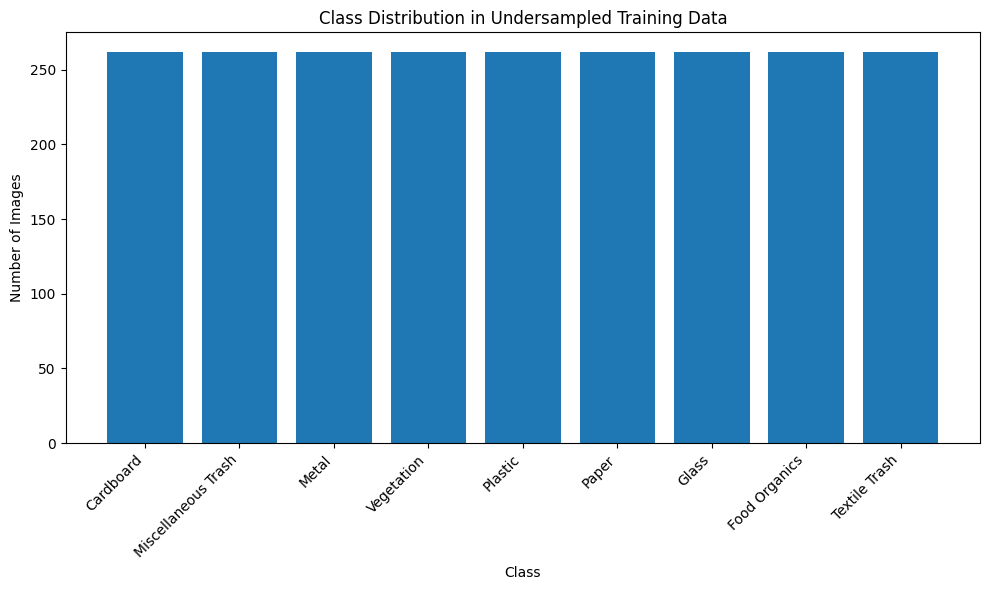

In [34]:
fig, ax = plt.subplots(figsize=(10, 6))

# Create a bar chart from under_counts
# important, you must leave `ax=ax`
ax.bar(undersampled_train_counts.keys(), undersampled_train_counts.values())
ax.set_xlabel('Class')
ax.set_ylabel('Number of Images')
ax.set_title('Class Distribution in Undersampled Training Data')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

 Checking for GPUs, so the device should be cuda.

In [35]:
if torch.cuda.is_available():
    device = "cuda"
elif torch.backends.mps.is_available():
    device = "mps"
else:
    device = "cpu"

print(f"Using {device} device.")

Using cuda device.


In [36]:
batch_size = 32

train_loader = DataLoader(train_dataset, batch_size = 32, shuffle = True)

print(type(train_loader))

<class 'torch.utils.data.dataloader.DataLoader'>


In [37]:
val_loader =  DataLoader(val_dataset, batch_size = 32, shuffle = False)

print(type(val_loader))

<class 'torch.utils.data.dataloader.DataLoader'>


In [38]:
data_iter = iter(train_loader)
images, labels = next(data_iter)

image_shape = images.shape
print("Shape of batch of images", image_shape)

label_shape = labels.shape
print("Shape of batch of labels:", label_shape)

Shape of batch of images torch.Size([32, 3, 224, 224])
Shape of batch of labels: torch.Size([32])


In [39]:
labels

tensor([7, 3, 4, 8, 2, 3, 3, 4, 6, 2, 1, 2, 6, 5, 1, 8, 5, 7, 3, 7, 5, 0, 5, 8,
        6, 3, 2, 2, 2, 6, 5, 8])

#Implementing Transfer Learning

In [40]:
model = torchvision.models.resnet50(weights=torchvision.models.ResNet50_Weights.DEFAULT)

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 194MB/s]


In [41]:
!pip install torchinfo

In [42]:
# Getting the shape of the test_batch of data, and using that as the input_size when calling summary on the model.

from torchinfo import summary

# Getting the shape of the first batch from the validation loader
test_batch = next(iter(val_loader))
input_size = test_batch[0].shape

# Calling summary on the model using the input_size
summary(model, input_size=input_size)

Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [32, 1000]                --
├─Conv2d: 1-1                            [32, 64, 112, 112]        9,408
├─BatchNorm2d: 1-2                       [32, 64, 112, 112]        128
├─ReLU: 1-3                              [32, 64, 112, 112]        --
├─MaxPool2d: 1-4                         [32, 64, 56, 56]          --
├─Sequential: 1-5                        [32, 256, 56, 56]         --
│    └─Bottleneck: 2-1                   [32, 256, 56, 56]         --
│    │    └─Conv2d: 3-1                  [32, 64, 56, 56]          4,096
│    │    └─BatchNorm2d: 3-2             [32, 64, 56, 56]          128
│    │    └─ReLU: 3-3                    [32, 64, 56, 56]          --
│    │    └─Conv2d: 3-4                  [32, 64, 56, 56]          36,864
│    │    └─BatchNorm2d: 3-5             [32, 64, 56, 56]          128
│    │    └─ReLU: 3-6                    [32, 64, 56, 56]          --
│ 

Setting params.requires grad false so propagation will not update gradient

In [43]:
for params in model.parameters():
    params.requires_grad = False

In [44]:
# Move the test batch to the selected device
test_batch = test_batch[0].to(device)
model_test_out = model(test_batch)
model_test_shape = model_test_out.shape

print("Output shape:", model_test_shape)

Output shape: torch.Size([32, 1000])


Modifying the model to my task. This model was meant for a task with 1000 classes. I only have 9 Classes in my data. Its important to get the name of the model using named_modules method

In [45]:
list(model.named_modules())[-1]

('fc', Linear(in_features=2048, out_features=1000, bias=True))

In [46]:
in_features = model.fc.in_features
in_features

2048

In [47]:
classifier = torch.nn.Sequential()

In [48]:
classification_layer = torch.nn.Linear(in_features, out_features=256)


# Adding the layer to my classifier
classifier.append(classification_layer)

Sequential(
  (0): Linear(in_features=2048, out_features=256, bias=True)
)

In [49]:
classifier.append(torch.nn.ReLU())
classifier.append(torch.nn.Dropout())

Sequential(
  (0): Linear(in_features=2048, out_features=256, bias=True)
  (1): ReLU()
  (2): Dropout(p=0.5, inplace=False)
)

I am building up a network with the following

Linear layer of 256 neurons
ReLU
Dropout
Linear layer of 9 neurons for output

In [50]:
output_layer = torch.nn.Linear(in_features=256, out_features=9)

# Add the layer to my classifier
classifier.append(output_layer)

Sequential(
  (0): Linear(in_features=2048, out_features=256, bias=True)
  (1): ReLU()
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=256, out_features=9, bias=True)
)

In [51]:
model.fc = classifier

In [52]:
# Creating the model summary
summary(model, input_size=batch_shape)

Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [32, 9]                   --
├─Conv2d: 1-1                            [32, 64, 112, 112]        (9,408)
├─BatchNorm2d: 1-2                       [32, 64, 112, 112]        (128)
├─ReLU: 1-3                              [32, 64, 112, 112]        --
├─MaxPool2d: 1-4                         [32, 64, 56, 56]          --
├─Sequential: 1-5                        [32, 256, 56, 56]         --
│    └─Bottleneck: 2-1                   [32, 256, 56, 56]         --
│    │    └─Conv2d: 3-1                  [32, 64, 56, 56]          (4,096)
│    │    └─BatchNorm2d: 3-2             [32, 64, 56, 56]          (128)
│    │    └─ReLU: 3-3                    [32, 64, 56, 56]          --
│    │    └─Conv2d: 3-4                  [32, 64, 56, 56]          (36,864)
│    │    └─BatchNorm2d: 3-5             [32, 64, 56, 56]          (128)
│    │    └─ReLU: 3-6                    [32, 64, 56, 56]   

#K-fold Cross-Validation

I will use this for splitting the data into k folds

In [53]:
import sklearn

In [54]:
k = 10

kfold_splitter = sklearn.model_selection.KFold(n_splits=k, shuffle=True, random_state=42)

train_nums, val_nums = next(kfold_splitter.split(range(100)))
fold_fraction = len(val_nums) / (len(train_nums) + len(val_nums))
print(f"One fold is {100*fold_fraction:.2f}%")

One fold is 10.00%


In [55]:
loss_fn = torch.nn.CrossEntropyLoss()
optimizer = torch.optim.Adam(model.parameters())

In [56]:
model.fc

Sequential(
  (0): Linear(in_features=2048, out_features=256, bias=True)
  (1): ReLU()
  (2): Dropout(p=0.5, inplace=False)
  (3): Linear(in_features=256, out_features=9, bias=True)
)

In [57]:
def reset_classifier(model):
    # Checking if the model has a 'classifier' attribute
    if hasattr(model, 'classifier') and isinstance(model.classifier, torch.nn.Sequential):
        # Reset parameters of the linear layers within the Sequential classifier
        for layer in model.classifier:
            if isinstance(layer, torch.nn.Linear):
                layer.reset_parameters()
    # Check if the model has an 'fc' attribute (for ResNet)
    elif hasattr(model, 'fc') and isinstance(model.fc, torch.nn.Sequential):
        # Reset parameters of the linear layers within the Sequential classifier
        for layer in model.fc:
            if isinstance(layer, torch.nn.Linear):
                layer.reset_parameters()
    elif hasattr(model, 'fc') and isinstance(model.fc, torch.nn.Linear):
         model.fc.reset_parameters()
    else:
        print("Warning: Model does not have a recognized classifier attribute (neither 'classifier' nor 'fc' sequential/linear). Skipping classifier reset.")

In [58]:
num_epochs = 6

Defining Train

In [59]:
import torch
import torch.nn as nn
import torch.optim as optim

def train(model, optimizer, loss_fn, train_loader, val_loader, epochs, device, use_train_accuracy=False):
    # Initialize lists to store metrics
    train_losses = []
    val_losses = []
    train_accuracies = []
    val_accuracies = []

    for epoch in range(epochs):
        # Training phase
        model.train()
        running_train_loss = 0.0
        correct_train = 0
        total_train = 0

        for inputs, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
            inputs, labels = inputs.to(device), labels.to(device)

            # Zero the gradients
            optimizer.zero_grad()

            # Forward pass
            outputs = model(inputs)
            loss = loss_fn(outputs, labels)

            # Backward pass and optimize
            loss.backward()
            optimizer.step()

            # Track training loss
            running_train_loss += loss.item() * inputs.size(0)

            # Calculate training accuracy if enabled
            if use_train_accuracy:
                _, predicted = torch.max(outputs, 1)
                total_train += labels.size(0)
                correct_train += (predicted == labels).sum().item()

        # Average training loss and accuracy for the epoch
        epoch_train_loss = running_train_loss / len(train_loader.dataset)
        train_losses.append(epoch_train_loss)
        if use_train_accuracy:
            epoch_train_acc = 100 * correct_train / total_train
            train_accuracies.append(epoch_train_acc)
        else:
            train_accuracies.append(0.0)  # Placeholder if accuracy is disabled

        # Validation phase
        model.eval()
        running_val_loss = 0.0
        correct_val = 0
        total_val = 0

        with torch.no_grad():
            for inputs, labels in val_loader:
                inputs, labels = inputs.to(device), labels.to(device)
                outputs = model(inputs)
                loss = loss_fn(outputs, labels)

                running_val_loss += loss.item() * inputs.size(0)

                # Calculate validation accuracy
                _, predicted = torch.max(outputs, 1)
                total_val += labels.size(0)
                correct_val += (predicted == labels).sum().item()

        # Average validation loss and accuracy for the epoch
        epoch_val_loss = running_val_loss / len(val_loader.dataset)
        val_losses.append(epoch_val_loss)
        epoch_val_acc = 100 * correct_val / total_val
        val_accuracies.append(epoch_val_acc)

        # Print epoch summary
        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, Val Acc: {epoch_val_acc:.2f}%")

    return train_losses, val_losses, train_losses, val_accuracies

In [60]:
training_records = {}
fold_count = 0

for train_idx, val_idx in kfold_splitter.split(np.arange(len(norm_dataset))):
    fold_count += 1
    print("*****Fold {}*****".format(fold_count))

    # Create datasets and data loaders for the current fold with the transform
    train_dataset = torch.utils.data.Subset(datasets.ImageFolder(root=data_path, transform=transform_norm), train_idx)
    val_dataset = torch.utils.data.Subset(datasets.ImageFolder(root=data_path, transform=transform_norm), val_idx)

    train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
    val_loader = DataLoader(val_dataset, batch_size=batch_size)

    # Reset the model
    reset_classifier(model)

    # Train
    train_losses, val_losses, train_accuracies, val_accuracies = train(
        model,
        optimizer,
        loss_fn,
        train_loader,
        val_loader,
        epochs=num_epochs,
        device=device,
        use_train_accuracy=False,
    )

    # Save training results for graphing
    training_records[fold_count] = {
        "train_losses": train_losses,
        "val_losses": val_losses,
        "val_accuracies": val_accuracies,
    }


*****Fold 1*****


Epoch 1/6: 100%|██████████| 134/134 [00:42<00:00,  3.15it/s]


Epoch 1/6, Train Loss: 1.1413, Val Loss: 0.5826, Val Acc: 79.83%


Epoch 2/6: 100%|██████████| 134/134 [00:43<00:00,  3.07it/s]


Epoch 2/6, Train Loss: 0.6305, Val Loss: 0.4746, Val Acc: 82.98%


Epoch 3/6: 100%|██████████| 134/134 [00:42<00:00,  3.15it/s]


Epoch 3/6, Train Loss: 0.4870, Val Loss: 0.4334, Val Acc: 84.45%


Epoch 4/6: 100%|██████████| 134/134 [00:42<00:00,  3.15it/s]


Epoch 4/6, Train Loss: 0.4145, Val Loss: 0.3527, Val Acc: 88.87%


Epoch 5/6: 100%|██████████| 134/134 [00:42<00:00,  3.12it/s]


Epoch 5/6, Train Loss: 0.3257, Val Loss: 0.3381, Val Acc: 86.76%


Epoch 6/6: 100%|██████████| 134/134 [00:42<00:00,  3.13it/s]


Epoch 6/6, Train Loss: 0.2798, Val Loss: 0.3220, Val Acc: 88.45%
*****Fold 2*****


Epoch 1/6: 100%|██████████| 134/134 [00:43<00:00,  3.08it/s]


Epoch 1/6, Train Loss: 1.0938, Val Loss: 0.6583, Val Acc: 78.36%


Epoch 2/6: 100%|██████████| 134/134 [00:41<00:00,  3.19it/s]


Epoch 2/6, Train Loss: 0.6036, Val Loss: 0.5206, Val Acc: 81.93%


Epoch 3/6: 100%|██████████| 134/134 [00:42<00:00,  3.16it/s]


Epoch 3/6, Train Loss: 0.4575, Val Loss: 0.4501, Val Acc: 83.61%


Epoch 4/6: 100%|██████████| 134/134 [00:42<00:00,  3.12it/s]


Epoch 4/6, Train Loss: 0.3673, Val Loss: 0.4462, Val Acc: 85.71%


Epoch 5/6: 100%|██████████| 134/134 [00:43<00:00,  3.07it/s]


Epoch 5/6, Train Loss: 0.3395, Val Loss: 0.3953, Val Acc: 87.18%


Epoch 6/6: 100%|██████████| 134/134 [00:42<00:00,  3.18it/s]


Epoch 6/6, Train Loss: 0.2669, Val Loss: 0.4134, Val Acc: 87.61%
*****Fold 3*****


Epoch 1/6: 100%|██████████| 134/134 [00:43<00:00,  3.11it/s]


Epoch 1/6, Train Loss: 1.0835, Val Loss: 0.6918, Val Acc: 77.26%


Epoch 2/6: 100%|██████████| 134/134 [00:42<00:00,  3.15it/s]


Epoch 2/6, Train Loss: 0.5873, Val Loss: 0.5045, Val Acc: 82.32%


Epoch 3/6: 100%|██████████| 134/134 [00:41<00:00,  3.20it/s]


Epoch 3/6, Train Loss: 0.4492, Val Loss: 0.4494, Val Acc: 84.84%


Epoch 4/6: 100%|██████████| 134/134 [00:43<00:00,  3.10it/s]


Epoch 4/6, Train Loss: 0.3561, Val Loss: 0.4096, Val Acc: 85.05%


Epoch 5/6: 100%|██████████| 134/134 [00:42<00:00,  3.14it/s]


Epoch 5/6, Train Loss: 0.3160, Val Loss: 0.4066, Val Acc: 85.26%


Epoch 6/6: 100%|██████████| 134/134 [00:41<00:00,  3.19it/s]


Epoch 6/6, Train Loss: 0.2544, Val Loss: 0.3788, Val Acc: 87.58%
*****Fold 4*****


Epoch 1/6: 100%|██████████| 134/134 [00:42<00:00,  3.16it/s]


Epoch 1/6, Train Loss: 1.1130, Val Loss: 0.6087, Val Acc: 78.32%


Epoch 2/6: 100%|██████████| 134/134 [00:43<00:00,  3.08it/s]


Epoch 2/6, Train Loss: 0.5927, Val Loss: 0.4728, Val Acc: 83.58%


Epoch 3/6: 100%|██████████| 134/134 [00:42<00:00,  3.15it/s]


Epoch 3/6, Train Loss: 0.4415, Val Loss: 0.4838, Val Acc: 82.11%


Epoch 4/6: 100%|██████████| 134/134 [00:43<00:00,  3.11it/s]


Epoch 4/6, Train Loss: 0.3762, Val Loss: 0.4258, Val Acc: 84.00%


Epoch 5/6: 100%|██████████| 134/134 [00:42<00:00,  3.13it/s]


Epoch 5/6, Train Loss: 0.3138, Val Loss: 0.4002, Val Acc: 86.32%


Epoch 6/6: 100%|██████████| 134/134 [00:43<00:00,  3.09it/s]


Epoch 6/6, Train Loss: 0.2698, Val Loss: 0.4152, Val Acc: 85.05%
*****Fold 5*****


Epoch 1/6: 100%|██████████| 134/134 [00:43<00:00,  3.05it/s]


Epoch 1/6, Train Loss: 1.1187, Val Loss: 0.6843, Val Acc: 77.26%


Epoch 2/6: 100%|██████████| 134/134 [00:42<00:00,  3.17it/s]


Epoch 2/6, Train Loss: 0.5850, Val Loss: 0.5250, Val Acc: 82.11%


Epoch 3/6: 100%|██████████| 134/134 [00:42<00:00,  3.14it/s]


Epoch 3/6, Train Loss: 0.4373, Val Loss: 0.5149, Val Acc: 81.47%


Epoch 4/6: 100%|██████████| 134/134 [00:42<00:00,  3.15it/s]


Epoch 4/6, Train Loss: 0.3584, Val Loss: 0.4840, Val Acc: 82.53%


Epoch 5/6: 100%|██████████| 134/134 [00:43<00:00,  3.09it/s]


Epoch 5/6, Train Loss: 0.3115, Val Loss: 0.5008, Val Acc: 84.21%


Epoch 6/6: 100%|██████████| 134/134 [00:42<00:00,  3.17it/s]


Epoch 6/6, Train Loss: 0.2780, Val Loss: 0.4871, Val Acc: 83.37%
*****Fold 6*****


Epoch 1/6: 100%|██████████| 134/134 [00:42<00:00,  3.16it/s]


Epoch 1/6, Train Loss: 1.1128, Val Loss: 0.6452, Val Acc: 80.00%


Epoch 2/6: 100%|██████████| 134/134 [00:42<00:00,  3.19it/s]


Epoch 2/6, Train Loss: 0.5795, Val Loss: 0.5405, Val Acc: 81.68%


Epoch 3/6: 100%|██████████| 134/134 [00:41<00:00,  3.23it/s]


Epoch 3/6, Train Loss: 0.4572, Val Loss: 0.4335, Val Acc: 86.95%


Epoch 4/6: 100%|██████████| 134/134 [00:41<00:00,  3.19it/s]


Epoch 4/6, Train Loss: 0.3588, Val Loss: 0.4066, Val Acc: 85.47%


Epoch 5/6: 100%|██████████| 134/134 [00:42<00:00,  3.19it/s]


Epoch 5/6, Train Loss: 0.3214, Val Loss: 0.4476, Val Acc: 85.68%


Epoch 6/6: 100%|██████████| 134/134 [00:42<00:00,  3.14it/s]


Epoch 6/6, Train Loss: 0.2757, Val Loss: 0.3804, Val Acc: 86.74%
*****Fold 7*****


Epoch 1/6: 100%|██████████| 134/134 [00:42<00:00,  3.15it/s]


Epoch 1/6, Train Loss: 1.1276, Val Loss: 0.6194, Val Acc: 79.37%


Epoch 2/6: 100%|██████████| 134/134 [00:42<00:00,  3.19it/s]


Epoch 2/6, Train Loss: 0.5701, Val Loss: 0.4927, Val Acc: 82.74%


Epoch 3/6: 100%|██████████| 134/134 [00:41<00:00,  3.22it/s]


Epoch 3/6, Train Loss: 0.4545, Val Loss: 0.4610, Val Acc: 85.26%


Epoch 4/6: 100%|██████████| 134/134 [00:42<00:00,  3.18it/s]


Epoch 4/6, Train Loss: 0.3745, Val Loss: 0.4674, Val Acc: 82.95%


Epoch 5/6: 100%|██████████| 134/134 [00:42<00:00,  3.17it/s]


Epoch 5/6, Train Loss: 0.2841, Val Loss: 0.4351, Val Acc: 84.63%


Epoch 6/6: 100%|██████████| 134/134 [00:42<00:00,  3.12it/s]


Epoch 6/6, Train Loss: 0.2513, Val Loss: 0.4252, Val Acc: 85.47%
*****Fold 8*****


Epoch 1/6: 100%|██████████| 134/134 [00:42<00:00,  3.18it/s]


Epoch 1/6, Train Loss: 1.1135, Val Loss: 0.5992, Val Acc: 79.16%


Epoch 2/6: 100%|██████████| 134/134 [00:42<00:00,  3.16it/s]


Epoch 2/6, Train Loss: 0.5804, Val Loss: 0.4580, Val Acc: 84.42%


Epoch 3/6: 100%|██████████| 134/134 [00:41<00:00,  3.19it/s]


Epoch 3/6, Train Loss: 0.4428, Val Loss: 0.4177, Val Acc: 84.84%


Epoch 4/6: 100%|██████████| 134/134 [00:42<00:00,  3.16it/s]


Epoch 4/6, Train Loss: 0.3654, Val Loss: 0.3570, Val Acc: 85.89%


Epoch 5/6: 100%|██████████| 134/134 [00:42<00:00,  3.17it/s]


Epoch 5/6, Train Loss: 0.3174, Val Loss: 0.3706, Val Acc: 86.74%


Epoch 6/6: 100%|██████████| 134/134 [00:41<00:00,  3.23it/s]


Epoch 6/6, Train Loss: 0.2635, Val Loss: 0.3493, Val Acc: 86.95%
*****Fold 9*****


Epoch 1/6: 100%|██████████| 134/134 [00:42<00:00,  3.12it/s]


Epoch 1/6, Train Loss: 1.1342, Val Loss: 0.6037, Val Acc: 79.37%


Epoch 2/6: 100%|██████████| 134/134 [00:42<00:00,  3.19it/s]


Epoch 2/6, Train Loss: 0.5843, Val Loss: 0.4947, Val Acc: 82.74%


Epoch 3/6: 100%|██████████| 134/134 [00:42<00:00,  3.16it/s]


Epoch 3/6, Train Loss: 0.4484, Val Loss: 0.4619, Val Acc: 82.95%


Epoch 4/6: 100%|██████████| 134/134 [00:42<00:00,  3.15it/s]


Epoch 4/6, Train Loss: 0.3685, Val Loss: 0.4280, Val Acc: 85.68%


Epoch 5/6: 100%|██████████| 134/134 [00:43<00:00,  3.09it/s]


Epoch 5/6, Train Loss: 0.3086, Val Loss: 0.4103, Val Acc: 84.63%


Epoch 6/6: 100%|██████████| 134/134 [00:42<00:00,  3.15it/s]


Epoch 6/6, Train Loss: 0.2657, Val Loss: 0.4299, Val Acc: 85.26%
*****Fold 10*****


Epoch 1/6: 100%|██████████| 134/134 [00:42<00:00,  3.17it/s]


Epoch 1/6, Train Loss: 1.1116, Val Loss: 0.5745, Val Acc: 82.11%


Epoch 2/6: 100%|██████████| 134/134 [00:42<00:00,  3.17it/s]


Epoch 2/6, Train Loss: 0.5924, Val Loss: 0.5456, Val Acc: 81.68%


Epoch 3/6: 100%|██████████| 134/134 [00:42<00:00,  3.15it/s]


Epoch 3/6, Train Loss: 0.4466, Val Loss: 0.4885, Val Acc: 84.42%


Epoch 4/6: 100%|██████████| 134/134 [00:42<00:00,  3.16it/s]


Epoch 4/6, Train Loss: 0.3773, Val Loss: 0.4176, Val Acc: 86.32%


Epoch 5/6: 100%|██████████| 134/134 [00:42<00:00,  3.16it/s]


Epoch 5/6, Train Loss: 0.3079, Val Loss: 0.3825, Val Acc: 86.74%


Epoch 6/6: 100%|██████████| 134/134 [00:41<00:00,  3.22it/s]


Epoch 6/6, Train Loss: 0.2691, Val Loss: 0.4215, Val Acc: 86.11%


In [61]:
print(type(training_records))
training_records.keys()

<class 'dict'>


dict_keys([1, 2, 3, 4, 5, 6, 7, 8, 9, 10])

In [62]:
print(type(training_records[1]))
training_records[1].keys()

<class 'dict'>


dict_keys(['train_losses', 'val_losses', 'val_accuracies'])

In [63]:
training_records[1]["train_losses"]

[1.1412980278258684,
 0.6305087647000911,
 0.48700914854642047,
 0.4145267293540198,
 0.3256682036801741,
 0.2797766905783269]

In [64]:
def plot_all_folds(data, measurement):
    for fold in data.keys():
        plt.plot(data[fold][measurement], label=f"Fold {fold}, {measurement}")
    plt.xlabel("Epochs")
    plt.legend()

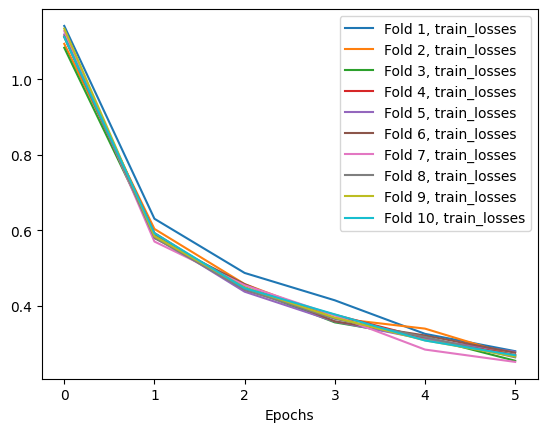

In [65]:
plot_all_folds(training_records, "train_losses")

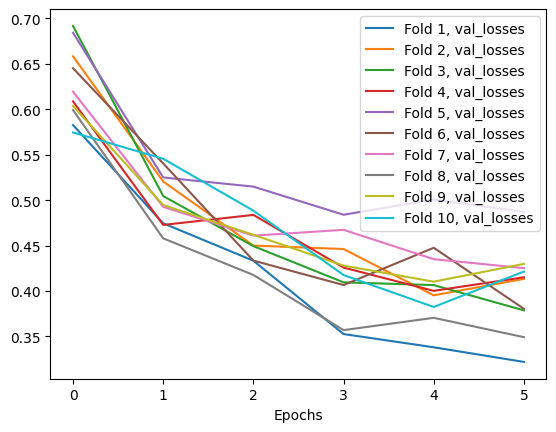

In [66]:
# Plot the validation losses
plot_all_folds(training_records, "val_losses")

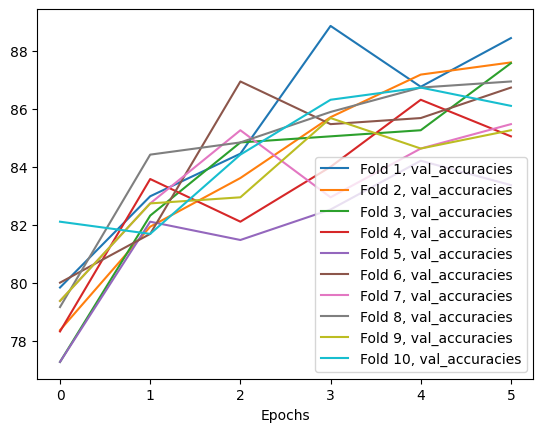

In [68]:
# Plot the validation accuracies
plot_all_folds(training_records, "val_accuracies")

In [69]:
def fold_average(data, measurement):
    return np.mean([data[fold][measurement][-1] for fold in data])


for measurement in training_records[1].keys():
    avg_measure = fold_average(training_records, measurement)
    print(f"Averaged {measurement}: {avg_measure}")

Averaged train_losses: 0.2674193598765154
Averaged val_losses: 0.40227342594349375
Averaged val_accuracies: 86.25767359575408


In [70]:
_, val_idx = list(kfold_splitter.split(np.arange(len(norm_dataset))))[-1]
# Use the norm_dataset for the validation dataset to ensure transforms are applied
val_dataset = torch.utils.data.Subset(norm_dataset, val_idx)
val_loader = DataLoader(val_dataset, batch_size=batch_size)

In [78]:
def predict(model, data_loader, device):
    """
    Generates predictions from a model for a given data loader.

    Parameters:
    - model: The PyTorch model to use for prediction.
    - data_loader: The DataLoader providing the data to predict on.
    - device: The device (e.g., 'cuda', 'cpu') to perform inference on.

    Returns:
    - A tensor of probabilities for each class for each input sample.
    """
    model.eval()  # Set the model to evaluation mode
    predictions = []

    with torch.no_grad():  # Disable gradient calculation
        for inputs, _ in data_loader:  # We don't need labels for prediction
            inputs = inputs.to(device)
            outputs = model(inputs)
            probabilities = torch.softmax(outputs, dim=1)  # Get probabilities
            predictions.append(probabilities.cpu())  # Move predictions to CPU and store

    return torch.cat(predictions)  # Concatenate predictions from all batches

In [79]:
probabilities = predict(model, val_loader, device)
predictions = torch.argmax(probabilities, dim=1)

In [80]:
test_batch = next(iter(dataset_loader))[0]
batch_shape = test_batch.shape

# Create the model summary
summary(model, input_size=batch_shape)

Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [32, 9]                   --
├─Conv2d: 1-1                            [32, 64, 112, 112]        (9,408)
├─BatchNorm2d: 1-2                       [32, 64, 112, 112]        (128)
├─ReLU: 1-3                              [32, 64, 112, 112]        --
├─MaxPool2d: 1-4                         [32, 64, 56, 56]          --
├─Sequential: 1-5                        [32, 256, 56, 56]         --
│    └─Bottleneck: 2-1                   [32, 256, 56, 56]         --
│    │    └─Conv2d: 3-1                  [32, 64, 56, 56]          (4,096)
│    │    └─BatchNorm2d: 3-2             [32, 64, 56, 56]          (128)
│    │    └─ReLU: 3-3                    [32, 64, 56, 56]          --
│    │    └─Conv2d: 3-4                  [32, 64, 56, 56]          (36,864)
│    │    └─BatchNorm2d: 3-5             [32, 64, 56, 56]          (128)
│    │    └─ReLU: 3-6                    [32, 64, 56, 56]   

Creating the confusion matrix

Classification Report:
                     precision    recall  f1-score   support

          Cardboard       0.81      0.91      0.86        33
      Food Organics       0.96      0.94      0.95        47
              Glass       0.93      0.86      0.89        44
              Metal       0.78      0.87      0.82        75
Miscellaneous Trash       0.69      0.74      0.71        42
              Paper       0.95      0.88      0.91        60
            Plastic       0.86      0.79      0.82       103
      Textile Trash       0.83      0.89      0.86        28
         Vegetation       0.98      0.98      0.98        43

           accuracy                           0.86       475
          macro avg       0.86      0.87      0.87       475
       weighted avg       0.87      0.86      0.86       475



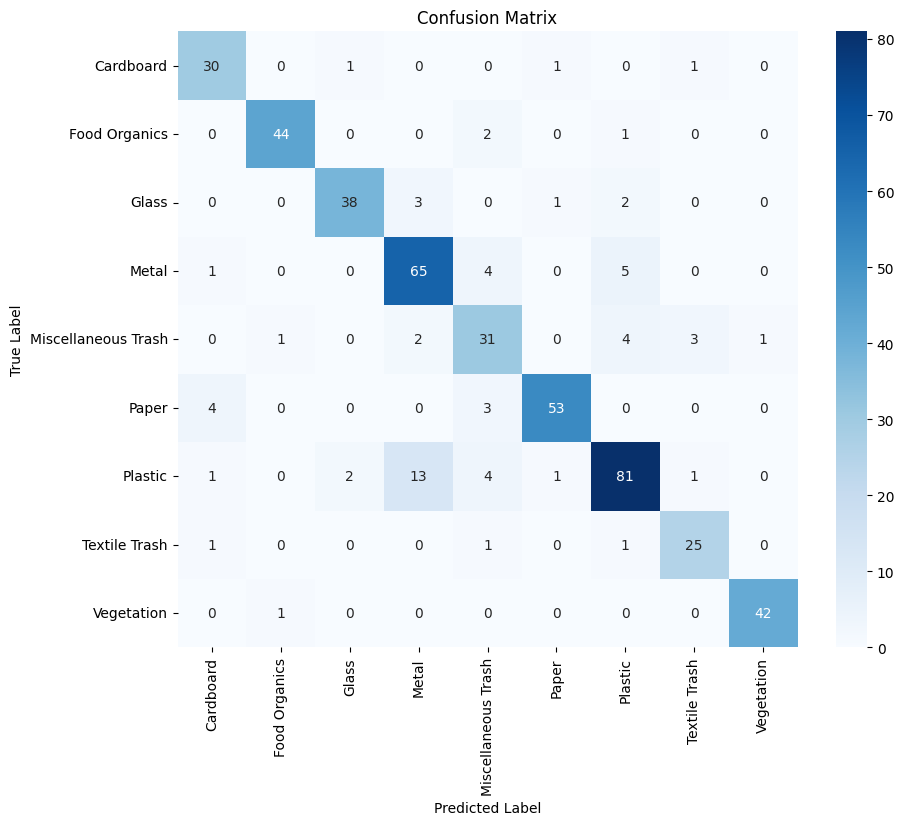

In [81]:
from sklearn.metrics import classification_report, confusion_matrix
# Get the true labels from the validation dataset
true_labels = torch.tensor(val_dataset.dataset.targets)[val_dataset.indices]

# Generate classification report
print("Classification Report:")
print(classification_report(true_labels, predictions, target_names=undersampled_dataset.classes))

# Generate confusion matrix
conf_matrix = confusion_matrix(true_labels, predictions)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=undersampled_dataset.classes, yticklabels=undersampled_dataset.classes)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()

In [155]:
#now saving the model  for future use, so i don't need to retrain it

torch.save(model.state_dict(), 'waste_classification_model.pth')
print("Model saved as waste_classification_model.pth")


Model saved as waste_classification_model.pth


Time inference and Memory usage of the model

In [84]:
#time inference of the above model

import time

# Ensuring the model is on the correct device and in evaluation mode
model.to(device)
model.eval()

# Getting a batch of data from the validation loader
data_iter = iter(val_loader)
inputs, labels = next(data_iter)
inputs = inputs.to(device)

# Measuring inference time
if device == 'cuda':
    start_event = torch.cuda.Event(enable_timing=True)
    end_event = torch.cuda.Event(enable_timing=True)

    start_event.record()
    with torch.no_grad():
        outputs = model(inputs)
    end_event.record()

    # Waiting for the events to complete
    torch.cuda.synchronize()

    # Calculating the elapsed time
    inference_time_ms = start_event.elapsed_time(end_event) # Time in milliseconds
    print(f"Inference time for a batch ({inputs.size(0)} images) on {device}: {inference_time_ms:.4f} ms")
    print(f"Average inference time per image: {inference_time_ms / inputs.size(0):.4f} ms")

else: # CPU inference
    start_time = time.time()
    with torch.no_grad():
        outputs = model(inputs)
    end_time = time.time()

    inference_time_sec = end_time - start_time # Time in seconds
    print(f"Inference time for a batch ({inputs.size(0)} images) on {device}: {inference_time_sec:.4f} seconds")
    print(f"Average inference time per image: {inference_time_sec / inputs.size(0):.4f} seconds")



Inference time for a batch (32 images) on cuda: 116.0323 ms
Average inference time per image: 3.6260 ms


Memory Usage

In [85]:
# Calculating memory usage of the model
# This will give an estimate of the memory used by the model's parameters and buffers.
# It does not include the memory used by the inputs or intermediate activations during inference.
param_size = 0
for param in model.parameters():
    param_size += param.nelement() * param.element_size()
buffer_size = 0
for buffer in model.buffers():
    buffer_size += buffer.nelement() * buffer.element_size()

model_memory_bytes = param_size + buffer_size
model_memory_mb = model_memory_bytes / (1024**2)

print(f"\nEstimated model memory usage: {model_memory_mb:.2f} MB")


# Requirements for deployability

print("\nRequirements for Deployability:")
print("- Model size: The estimated memory usage of the model is approximately", f"{model_memory_mb:.2f} MB", ". This is a key factor for deployment, especially on devices with limited memory (e.g., mobile or edge devices).")
print("- Computational resources: The model is a ResNet50 based architecture, which requires significant computational power for inference, especially the convolutional layers. The measured inference time on the available hardware gives an indication of the required processing speed.")
if device == 'cuda':
    print(f"  - Inference time per image on {device}: {inference_time_ms / inputs.size(0):.4f} ms")
else:
     print(f"  - Inference time per image on {device}: {inference_time_sec / inputs.size(0):.4f} seconds")
print("- Software dependencies: The deployed environment will need to have Python, PyTorch, and other libraries used (e.g., torchvision, numpy, sklearn, PIL) installed.")
print("- Hardware acceleration: For optimal performance, particularly low latency inference, access to hardware acceleration (like GPUs, TPUs, or specialized AI chips) is highly beneficial, as indicated by the difference in inference time between CPU and GPU.")
print("- Input preprocessing: The deployed model will require inputs to be preprocessed in the same way as during training, including resizing to 224x224, converting to a tensor, and normalizing using the calculated mean and standard deviation.")
print(f"  - Image size: 224x224 pixels")
print(f"  - Normalization Mean: {mean.tolist()}") # Assuming mean is a tensor
print(f"  - Normalization Std Dev: {std.tolist()}") # Assuming std is a tensor
print("- Output interpretation: The model outputs probabilities for 9 classes. The deployment code will need to map these probabilities/predictions back to the original class names: ", undersampled_dataset.classes)
print("- Platform: The specific deployment platform (e.g., server, cloud, mobile, edge device) will influence the required libraries, hardware, and optimization techniques (like quantization or model pruning).")



Estimated model memory usage: 91.89 MB

Requirements for Deployability:
- Model size: The estimated memory usage of the model is approximately 91.89 MB . This is a key factor for deployment, especially on devices with limited memory (e.g., mobile or edge devices).
- Computational resources: The model is a ResNet50 based architecture, which requires significant computational power for inference, especially the convolutional layers. The measured inference time on the available hardware gives an indication of the required processing speed.
  - Inference time per image on cuda: 3.6260 ms
- Software dependencies: The deployed environment will need to have Python, PyTorch, and other libraries used (e.g., torchvision, numpy, sklearn, PIL) installed.
- Hardware acceleration: For optimal performance, particularly low latency inference, access to hardware acceleration (like GPUs, TPUs, or specialized AI chips) is highly beneficial, as indicated by the difference in inference time between CPU an

#Lightweight Custom CNN Model

This is the development of the Lightweight Custom CNN. I start by creating a Depthwise Separable Convolution class as part of lightweight design architecture.

In [140]:
class DepthwiseSeparableConv(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride=1, padding=0):
        super(DepthwiseSeparableConv, self).__init__()
        self.depthwise = nn.Conv2d(in_channels, in_channels, kernel_size=kernel_size, stride=stride, padding=padding, groups=in_channels, bias=False)
        self.pointwise = nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1, padding=0, bias=False)
        self.bn = nn.BatchNorm2d(out_channels)
        self.relu = nn.ReLU6(inplace=True) # Using ReLU6 for Mobilenet style

    def forward(self, x):
        x = self.depthwise(x)
        x = self.pointwise(x)
        x = self.bn(x)
        x = self.relu(x)
        return x

Squeeze Excitation

In [141]:
class SqueezeExcitation(nn.Module):
    def __init__(self, channel, reduction=16):
        super(SqueezeExcitation, self).__init__()
        self.avg_pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(channel, channel // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(channel // reduction, channel, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.avg_pool(x).view(b, c)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y.expand_as(x)

Spatial Attention

In [142]:
class SpatialAttention(nn.Module):
    def __init__(self, kernel_size=7):
        super(SpatialAttention, self).__init__()
        assert kernel_size in (3, 7), 'kernel size must be 3 or 7'
        padding = 3 if kernel_size == 7 else 1

        self.conv1 = nn.Conv2d(2, 1, kernel_size, padding=padding, bias=False)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        avg_out = torch.mean(x, dim=1, keepdim=True)
        max_out, _ = torch.max(x, dim=1, keepdim=True)
        x_concat = torch.cat([avg_out, max_out], dim=1)
        x_out = self.conv1(x_concat)
        return x * self.sigmoid(x_out)

CBAM

In [143]:
class CBAM(nn.Module):
    def __init__(self, gate_channels, reduction_ratio=16, spatial_kernel=7):
        super(CBAM, self).__init__()
        self.channel_attention = SqueezeExcitation(gate_channels, reduction_ratio)
        self.spatial_attention = SpatialAttention(spatial_kernel)

    def forward(self, x):
        x_out = self.channel_attention(x)
        x_out = self.spatial_attention(x_out)
        return x_out

Inverted Residual Block

In [144]:
class InvertedResidualBlock(nn.Module):
    def __init__(self, in_channels, out_channels, stride, expand_ratio, use_attention=None):
        super(InvertedResidualBlock, self).__init__()
        hidden_dim = round(in_channels * expand_ratio)
        self.identity_connection = stride == 1 and in_channels == out_channels
        self.use_attention = use_attention

        layers = []
        if expand_ratio != 1:
            # Linear bottleneck expansion
            layers.append(nn.Conv2d(in_channels, hidden_dim, kernel_size=1, stride=1, padding=0, bias=False))
            layers.append(nn.BatchNorm2d(hidden_dim))
            layers.append(nn.ReLU6(inplace=True))
            # Depthwise separable convolution
        layers.append(nn.Conv2d(hidden_dim, hidden_dim, kernel_size=3, stride=stride, padding=1, groups=hidden_dim, bias=False))
        layers.append(nn.BatchNorm2d(hidden_dim))
            # Use ReLU6 for Mobilenet style
        layers.append(nn.ReLU6(inplace=True))
        # Pointwise convolution (linear bottleneck contraction)
        layers.append(nn.Conv2d(hidden_dim, out_channels, kernel_size=1, stride=1, padding=0, bias=False))
        layers.append(nn.BatchNorm2d(out_channels))

        self.conv = nn.Sequential(*layers)

        # Attention mechanism
        if self.use_attention == 'SE':
            self.attention = SqueezeExcitation(out_channels)
        elif self.use_attention == 'CBAM':
             self.attention = CBAM(out_channels)
        else:
            self.attention = None

    def forward(self, x):
        identity = x
        out = self.conv(x)

        if self.use_attention:
            out = self.attention(out)

        if self.identity_connection:
            out = out + identity
        return out

In [145]:
def forward(self, x):
        identity = x
        out = self.conv(x)

        if self.use_attention:
            out = self.attention(out)

        if self.identity_connection:
            out = out + identity
        return out

#Now creating my Lightweight Custom CNN encompassing the relevant design principles as defined above

In [159]:
class CustomCNN(nn.Module):
    def __init__(self, num_classes=9, width_mult=0.75):
        super(CustomCNN, self).__init__()
        input_channels = int(32 * width_mult)
        last_channel = int(1280 * width_mult)

        # Initial convolution layer
        features = [
            nn.Sequential(
                nn.Conv2d(3, input_channels, kernel_size=3, stride=2, padding=1, bias=False),
                nn.BatchNorm2d(input_channels),
                nn.ReLU6(inplace=True)
            )
        ]
        # Inverted Residual Blocks
        # t: expand_ratio, c: output_channels, n: num_repeats, s: stride
        # inverted_residual_settings = [
           # [1, 16, 1, 1, None],
           # [6, 24, 2, 2, 'SE'], # Add SE Attention
           # [6, 32, 3, 2, 'CBAM'], # Add CBAM Attention
           # [6, 64, 6, 2, 'SE'],
           # [6, 96, 3, 1, 'CBAM'],
           # [6, 160, 4, 2, 'SE'],
           # [6, 320, 1, 1, None]
       # ]
        inverted_residual_settings = [
            [1, 16, 1, 1, 'SE'],    # Added SE to first block
            [6, 24, 2, 2, 'CBAM'],
            [6, 32, 4, 2, 'CBAM'],  # Increased num_blocks
            [6, 64, 6, 2, 'CBAM'],  # Changed SE to CBAM which is often slightly better for accuracy
            [6, 96, 4, 1, 'CBAM'],  # Increased num_blocks
            [6, 160, 4, 2, 'CBAM'], # Changed SE to CBAM
            [8, 320, 1, 1, 'CBAM']  # Increased expansion and added CBAM
      ]

        for t, c, n, s, attention_type in inverted_residual_settings:
            output_channels = int(c * width_mult)
            for i in range(n):
                stride = s if i == 0 else 1
                features.append(InvertedResidualBlock(input_channels, output_channels, stride, expand_ratio=t, use_attention=attention_type if i == 0 or i == n-1 else None)) # Apply attention to first and last block of sequence
                input_channels = output_channels
                # Building the rest of the layers
        features.append(nn.Sequential(
         nn.Conv2d(input_channels, int(1280*width_mult), kernel_size=1, stride=1, padding=0, bias=False),
        nn.BatchNorm2d(int(1280*width_mult))
))


        self.features = nn.Sequential(*features)

        # Global Average Pooling and Classifier
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.classifier = nn.Sequential(
            nn.Dropout(0.2),
            nn.Linear(last_channel, num_classes)
        )

        # Initialize weights
        self._initialize_weights()

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out')
                if m.bias is not None: # Check if bias exists
                    nn.init.zeros_(m.bias)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.ones_(m.weight)
                nn.init.zeros_(m.bias)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0, 0.0001)
                if m.bias is not None: # Check if bias exists
                    nn.init.zeros_(m.bias)

In [147]:
    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = x.view(x.size(0), -1)
        x = self.classifier(x)
        return x

    def _initialize_weights(self):
        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out')
                if m.bias is not None: # Check if bias exists
                    nn.init.zeros_(m.bias)
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.ones_(m.weight)
                nn.init.zeros_(m.bias)
            elif isinstance(m, nn.Linear):
                nn.init.normal_(m.weight, 0, 0.0001)
                if m.bias is not None: # Check if bias exists
                    nn.init.zeros_(m.bias)



Adding k-fold cross-validation to get a more robust estimate of model's performance as well as adding early stopping to avoid overfitting

Starting K-Fold Cross-Validation with 10 folds and Early Stopping...
*****Fold 1*****


Fold 1, Epoch 1/50: 100%|██████████| 134/134 [00:46<00:00,  2.90it/s]


Fold 1, Epoch 1/50, Train Loss: 2.1089, Val Loss: 1.9546, Val Acc: 29.41%


Fold 1, Epoch 2/50: 100%|██████████| 134/134 [00:47<00:00,  2.83it/s]


Fold 1, Epoch 2/50, Train Loss: 1.8324, Val Loss: 1.7061, Val Acc: 40.34%


Fold 1, Epoch 3/50: 100%|██████████| 134/134 [00:45<00:00,  2.92it/s]


Fold 1, Epoch 3/50, Train Loss: 1.6672, Val Loss: 1.5463, Val Acc: 46.22%


Fold 1, Epoch 4/50: 100%|██████████| 134/134 [00:47<00:00,  2.82it/s]


Fold 1, Epoch 4/50, Train Loss: 1.5613, Val Loss: 1.5036, Val Acc: 44.12%


Fold 1, Epoch 5/50: 100%|██████████| 134/134 [00:44<00:00,  2.99it/s]


Fold 1, Epoch 5/50, Train Loss: 1.4994, Val Loss: 1.4766, Val Acc: 44.96%


Fold 1, Epoch 6/50: 100%|██████████| 134/134 [00:45<00:00,  2.93it/s]


Fold 1, Epoch 6/50, Train Loss: 1.4496, Val Loss: 1.4202, Val Acc: 48.74%


Fold 1, Epoch 7/50: 100%|██████████| 134/134 [00:45<00:00,  2.93it/s]


Fold 1, Epoch 7/50, Train Loss: 1.4181, Val Loss: 1.4186, Val Acc: 49.37%


Fold 1, Epoch 8/50: 100%|██████████| 134/134 [00:45<00:00,  2.92it/s]


Fold 1, Epoch 8/50, Train Loss: 1.3682, Val Loss: 1.3797, Val Acc: 50.63%


Fold 1, Epoch 9/50: 100%|██████████| 134/134 [00:45<00:00,  2.96it/s]


Fold 1, Epoch 9/50, Train Loss: 1.3439, Val Loss: 1.4066, Val Acc: 49.37%


Fold 1, Epoch 10/50: 100%|██████████| 134/134 [00:46<00:00,  2.88it/s]


Fold 1, Epoch 10/50, Train Loss: 1.3148, Val Loss: 1.3498, Val Acc: 54.62%


Fold 1, Epoch 11/50: 100%|██████████| 134/134 [00:47<00:00,  2.84it/s]


Fold 1, Epoch 11/50, Train Loss: 1.2787, Val Loss: 1.2959, Val Acc: 53.15%


Fold 1, Epoch 12/50: 100%|██████████| 134/134 [00:46<00:00,  2.90it/s]


Fold 1, Epoch 12/50, Train Loss: 1.2505, Val Loss: 1.3033, Val Acc: 54.62%


Fold 1, Epoch 13/50: 100%|██████████| 134/134 [00:46<00:00,  2.90it/s]


Fold 1, Epoch 13/50, Train Loss: 1.2400, Val Loss: 1.2797, Val Acc: 55.04%


Fold 1, Epoch 14/50: 100%|██████████| 134/134 [00:46<00:00,  2.87it/s]


Fold 1, Epoch 14/50, Train Loss: 1.1924, Val Loss: 1.2449, Val Acc: 54.41%


Fold 1, Epoch 15/50: 100%|██████████| 134/134 [00:46<00:00,  2.91it/s]


Fold 1, Epoch 15/50, Train Loss: 1.1954, Val Loss: 1.2181, Val Acc: 54.83%


Fold 1, Epoch 16/50: 100%|██████████| 134/134 [00:45<00:00,  2.91it/s]


Fold 1, Epoch 16/50, Train Loss: 1.1370, Val Loss: 1.1561, Val Acc: 56.30%


Fold 1, Epoch 17/50: 100%|██████████| 134/134 [00:46<00:00,  2.88it/s]


Fold 1, Epoch 17/50, Train Loss: 1.1109, Val Loss: 1.1168, Val Acc: 61.76%


Fold 1, Epoch 18/50: 100%|██████████| 134/134 [00:46<00:00,  2.88it/s]


Fold 1, Epoch 18/50, Train Loss: 1.0999, Val Loss: 1.1306, Val Acc: 58.82%


Fold 1, Epoch 19/50: 100%|██████████| 134/134 [00:45<00:00,  2.93it/s]


Fold 1, Epoch 19/50, Train Loss: 1.0392, Val Loss: 1.0745, Val Acc: 62.39%


Fold 1, Epoch 20/50: 100%|██████████| 134/134 [00:45<00:00,  2.95it/s]


Fold 1, Epoch 20/50, Train Loss: 1.0386, Val Loss: 1.0625, Val Acc: 63.24%


Fold 1, Epoch 21/50: 100%|██████████| 134/134 [00:46<00:00,  2.90it/s]


Fold 1, Epoch 21/50, Train Loss: 0.9914, Val Loss: 1.0496, Val Acc: 60.71%


Fold 1, Epoch 22/50: 100%|██████████| 134/134 [00:46<00:00,  2.91it/s]


Fold 1, Epoch 22/50, Train Loss: 0.9605, Val Loss: 1.0403, Val Acc: 65.13%


Fold 1, Epoch 23/50: 100%|██████████| 134/134 [00:45<00:00,  2.93it/s]


Fold 1, Epoch 23/50, Train Loss: 0.9474, Val Loss: 1.0503, Val Acc: 60.71%


Fold 1, Epoch 24/50: 100%|██████████| 134/134 [00:45<00:00,  2.93it/s]


Fold 1, Epoch 24/50, Train Loss: 0.9152, Val Loss: 1.0405, Val Acc: 59.24%


Fold 1, Epoch 25/50: 100%|██████████| 134/134 [00:46<00:00,  2.90it/s]


Fold 1, Epoch 25/50, Train Loss: 0.8872, Val Loss: 0.9809, Val Acc: 64.71%


Fold 1, Epoch 26/50: 100%|██████████| 134/134 [00:46<00:00,  2.89it/s]


Fold 1, Epoch 26/50, Train Loss: 0.8605, Val Loss: 1.0014, Val Acc: 63.24%


Fold 1, Epoch 27/50: 100%|██████████| 134/134 [00:46<00:00,  2.91it/s]


Fold 1, Epoch 27/50, Train Loss: 0.8303, Val Loss: 1.0513, Val Acc: 60.50%


Fold 1, Epoch 28/50: 100%|██████████| 134/134 [00:45<00:00,  2.92it/s]


Fold 1, Epoch 28/50, Train Loss: 0.8173, Val Loss: 0.9432, Val Acc: 65.55%


Fold 1, Epoch 29/50: 100%|██████████| 134/134 [00:46<00:00,  2.87it/s]


Fold 1, Epoch 29/50, Train Loss: 0.7979, Val Loss: 1.0513, Val Acc: 62.82%


Fold 1, Epoch 30/50: 100%|██████████| 134/134 [00:46<00:00,  2.89it/s]


Fold 1, Epoch 30/50, Train Loss: 0.7734, Val Loss: 0.9517, Val Acc: 65.97%


Fold 1, Epoch 31/50: 100%|██████████| 134/134 [00:46<00:00,  2.89it/s]


Fold 1, Epoch 31/50, Train Loss: 0.7394, Val Loss: 1.0001, Val Acc: 66.18%


Fold 1, Epoch 32/50: 100%|██████████| 134/134 [00:46<00:00,  2.87it/s]


Fold 1, Epoch 32/50, Train Loss: 0.7342, Val Loss: 0.9933, Val Acc: 65.34%


Fold 1, Epoch 33/50: 100%|██████████| 134/134 [00:45<00:00,  2.93it/s]


Fold 1, Epoch 33/50, Train Loss: 0.7305, Val Loss: 0.9711, Val Acc: 65.13%


Fold 1, Epoch 34/50: 100%|██████████| 134/134 [00:45<00:00,  2.91it/s]


Fold 1, Epoch 34/50, Train Loss: 0.6561, Val Loss: 0.9612, Val Acc: 65.34%


Fold 1, Epoch 35/50: 100%|██████████| 134/134 [00:46<00:00,  2.88it/s]


Fold 1, Epoch 35/50, Train Loss: 0.6395, Val Loss: 0.9423, Val Acc: 67.65%
Early stopping triggered at epoch 35 for Fold 1.


*****Fold 2*****


Fold 2, Epoch 1/50: 100%|██████████| 134/134 [00:46<00:00,  2.90it/s]


Fold 2, Epoch 1/50, Train Loss: 1.0129, Val Loss: 0.5429, Val Acc: 82.98%


Fold 2, Epoch 2/50: 100%|██████████| 134/134 [00:46<00:00,  2.89it/s]


Fold 2, Epoch 2/50, Train Loss: 0.6971, Val Loss: 0.4900, Val Acc: 82.98%


Fold 2, Epoch 3/50: 100%|██████████| 134/134 [00:46<00:00,  2.89it/s]


Fold 2, Epoch 3/50, Train Loss: 0.6459, Val Loss: 0.5275, Val Acc: 82.35%


Fold 2, Epoch 4/50: 100%|██████████| 134/134 [00:45<00:00,  2.96it/s]


Fold 2, Epoch 4/50, Train Loss: 0.6242, Val Loss: 0.5412, Val Acc: 80.88%


Fold 2, Epoch 5/50: 100%|██████████| 134/134 [00:45<00:00,  2.96it/s]


Fold 2, Epoch 5/50, Train Loss: 0.6233, Val Loss: 0.5800, Val Acc: 79.41%


Fold 2, Epoch 6/50: 100%|██████████| 134/134 [00:45<00:00,  2.94it/s]


Fold 2, Epoch 6/50, Train Loss: 0.5652, Val Loss: 0.6171, Val Acc: 75.84%


Fold 2, Epoch 7/50: 100%|██████████| 134/134 [00:46<00:00,  2.88it/s]


Fold 2, Epoch 7/50, Train Loss: 0.5505, Val Loss: 0.5805, Val Acc: 79.41%


Fold 2, Epoch 8/50: 100%|██████████| 134/134 [00:46<00:00,  2.89it/s]


Fold 2, Epoch 8/50, Train Loss: 0.5287, Val Loss: 0.5489, Val Acc: 80.67%


Fold 2, Epoch 9/50: 100%|██████████| 134/134 [00:45<00:00,  2.94it/s]


Fold 2, Epoch 9/50, Train Loss: 0.4775, Val Loss: 0.6205, Val Acc: 77.10%
Early stopping triggered at epoch 9 for Fold 2.


*****Fold 3*****


Fold 3, Epoch 1/50: 100%|██████████| 134/134 [00:46<00:00,  2.86it/s]


Fold 3, Epoch 1/50, Train Loss: 0.8845, Val Loss: 0.3860, Val Acc: 89.05%


Fold 3, Epoch 2/50: 100%|██████████| 134/134 [00:46<00:00,  2.91it/s]


Fold 3, Epoch 2/50, Train Loss: 0.5086, Val Loss: 0.3592, Val Acc: 88.42%


Fold 3, Epoch 3/50: 100%|██████████| 134/134 [00:46<00:00,  2.90it/s]


Fold 3, Epoch 3/50, Train Loss: 0.4750, Val Loss: 0.4387, Val Acc: 82.11%


Fold 3, Epoch 4/50: 100%|██████████| 134/134 [00:46<00:00,  2.88it/s]


Fold 3, Epoch 4/50, Train Loss: 0.4681, Val Loss: 0.4171, Val Acc: 85.05%


Fold 3, Epoch 5/50: 100%|██████████| 134/134 [00:46<00:00,  2.88it/s]


Fold 3, Epoch 5/50, Train Loss: 0.4334, Val Loss: 0.4933, Val Acc: 82.53%


Fold 3, Epoch 6/50: 100%|██████████| 134/134 [00:46<00:00,  2.89it/s]


Fold 3, Epoch 6/50, Train Loss: 0.3956, Val Loss: 0.4736, Val Acc: 84.00%


Fold 3, Epoch 7/50: 100%|██████████| 134/134 [00:46<00:00,  2.87it/s]


Fold 3, Epoch 7/50, Train Loss: 0.3648, Val Loss: 0.5046, Val Acc: 83.37%


Fold 3, Epoch 8/50: 100%|██████████| 134/134 [00:45<00:00,  2.95it/s]


Fold 3, Epoch 8/50, Train Loss: 0.3495, Val Loss: 0.4897, Val Acc: 82.95%


Fold 3, Epoch 9/50: 100%|██████████| 134/134 [00:45<00:00,  2.93it/s]


Fold 3, Epoch 9/50, Train Loss: 0.3393, Val Loss: 0.5067, Val Acc: 80.84%
Early stopping triggered at epoch 9 for Fold 3.


*****Fold 4*****


Fold 4, Epoch 1/50: 100%|██████████| 134/134 [00:46<00:00,  2.89it/s]


Fold 4, Epoch 1/50, Train Loss: 0.7287, Val Loss: 0.2039, Val Acc: 95.37%


Fold 4, Epoch 2/50: 100%|██████████| 134/134 [00:45<00:00,  2.92it/s]


Fold 4, Epoch 2/50, Train Loss: 0.3782, Val Loss: 0.2095, Val Acc: 94.74%


Fold 4, Epoch 3/50: 100%|██████████| 134/134 [00:46<00:00,  2.89it/s]


Fold 4, Epoch 3/50, Train Loss: 0.3527, Val Loss: 0.2786, Val Acc: 90.32%


Fold 4, Epoch 4/50: 100%|██████████| 134/134 [00:46<00:00,  2.90it/s]


Fold 4, Epoch 4/50, Train Loss: 0.3195, Val Loss: 0.2346, Val Acc: 92.63%


Fold 4, Epoch 5/50: 100%|██████████| 134/134 [00:45<00:00,  2.96it/s]


Fold 4, Epoch 5/50, Train Loss: 0.2925, Val Loss: 0.2511, Val Acc: 92.42%


Fold 4, Epoch 6/50: 100%|██████████| 134/134 [00:44<00:00,  2.98it/s]


Fold 4, Epoch 6/50, Train Loss: 0.2808, Val Loss: 0.2609, Val Acc: 91.16%


Fold 4, Epoch 7/50: 100%|██████████| 134/134 [00:46<00:00,  2.91it/s]


Fold 4, Epoch 7/50, Train Loss: 0.2948, Val Loss: 0.3144, Val Acc: 90.11%


Fold 4, Epoch 8/50: 100%|██████████| 134/134 [00:44<00:00,  3.00it/s]


Fold 4, Epoch 8/50, Train Loss: 0.2831, Val Loss: 0.3007, Val Acc: 88.21%
Early stopping triggered at epoch 8 for Fold 4.


*****Fold 5*****


Fold 5, Epoch 1/50: 100%|██████████| 134/134 [00:44<00:00,  2.98it/s]


Fold 5, Epoch 1/50, Train Loss: 0.6110, Val Loss: 0.1282, Val Acc: 98.11%


Fold 5, Epoch 2/50: 100%|██████████| 134/134 [00:46<00:00,  2.91it/s]


Fold 5, Epoch 2/50, Train Loss: 0.2741, Val Loss: 0.1130, Val Acc: 97.68%


Fold 5, Epoch 3/50: 100%|██████████| 134/134 [00:45<00:00,  2.92it/s]


Fold 5, Epoch 3/50, Train Loss: 0.2403, Val Loss: 0.1626, Val Acc: 95.37%


Fold 5, Epoch 4/50: 100%|██████████| 134/134 [00:46<00:00,  2.90it/s]


Fold 5, Epoch 4/50, Train Loss: 0.2222, Val Loss: 0.1337, Val Acc: 95.58%


Fold 5, Epoch 5/50: 100%|██████████| 134/134 [00:46<00:00,  2.86it/s]


Fold 5, Epoch 5/50, Train Loss: 0.2261, Val Loss: 0.2373, Val Acc: 91.58%


Fold 5, Epoch 6/50: 100%|██████████| 134/134 [00:45<00:00,  2.93it/s]


Fold 5, Epoch 6/50, Train Loss: 0.2674, Val Loss: 0.2052, Val Acc: 92.42%


Fold 5, Epoch 7/50: 100%|██████████| 134/134 [00:45<00:00,  2.94it/s]


Fold 5, Epoch 7/50, Train Loss: 0.2156, Val Loss: 0.1997, Val Acc: 93.26%


Fold 5, Epoch 8/50: 100%|██████████| 134/134 [00:46<00:00,  2.89it/s]


Fold 5, Epoch 8/50, Train Loss: 0.1886, Val Loss: 0.2464, Val Acc: 90.53%


Fold 5, Epoch 9/50: 100%|██████████| 134/134 [00:45<00:00,  2.93it/s]


Fold 5, Epoch 9/50, Train Loss: 0.1753, Val Loss: 0.2101, Val Acc: 92.63%
Early stopping triggered at epoch 9 for Fold 5.


*****Fold 6*****


Fold 6, Epoch 1/50: 100%|██████████| 134/134 [00:45<00:00,  2.93it/s]


Fold 6, Epoch 1/50, Train Loss: 0.5054, Val Loss: 0.0805, Val Acc: 99.16%


Fold 6, Epoch 2/50: 100%|██████████| 134/134 [00:46<00:00,  2.91it/s]


Fold 6, Epoch 2/50, Train Loss: 0.2088, Val Loss: 0.0760, Val Acc: 97.89%


Fold 6, Epoch 3/50: 100%|██████████| 134/134 [00:46<00:00,  2.91it/s]


Fold 6, Epoch 3/50, Train Loss: 0.1738, Val Loss: 0.0885, Val Acc: 96.63%


Fold 6, Epoch 4/50: 100%|██████████| 134/134 [00:45<00:00,  2.93it/s]


Fold 6, Epoch 4/50, Train Loss: 0.1617, Val Loss: 0.0897, Val Acc: 98.32%


Fold 6, Epoch 5/50: 100%|██████████| 134/134 [00:46<00:00,  2.90it/s]


Fold 6, Epoch 5/50, Train Loss: 0.1608, Val Loss: 0.1014, Val Acc: 96.84%


Fold 6, Epoch 6/50: 100%|██████████| 134/134 [00:45<00:00,  2.91it/s]


Fold 6, Epoch 6/50, Train Loss: 0.1701, Val Loss: 0.1782, Val Acc: 94.95%


Fold 6, Epoch 7/50: 100%|██████████| 134/134 [00:46<00:00,  2.91it/s]


Fold 6, Epoch 7/50, Train Loss: 0.1704, Val Loss: 0.1311, Val Acc: 95.79%


Fold 6, Epoch 8/50: 100%|██████████| 134/134 [00:46<00:00,  2.89it/s]


Fold 6, Epoch 8/50, Train Loss: 0.1582, Val Loss: 0.2215, Val Acc: 92.00%


Fold 6, Epoch 9/50: 100%|██████████| 134/134 [00:45<00:00,  2.96it/s]


Fold 6, Epoch 9/50, Train Loss: 0.2022, Val Loss: 0.2029, Val Acc: 93.05%
Early stopping triggered at epoch 9 for Fold 6.


*****Fold 7*****


Fold 7, Epoch 1/50: 100%|██████████| 134/134 [00:45<00:00,  2.95it/s]


Fold 7, Epoch 1/50, Train Loss: 0.4413, Val Loss: 0.0603, Val Acc: 99.37%


Fold 7, Epoch 2/50: 100%|██████████| 134/134 [00:46<00:00,  2.87it/s]


Fold 7, Epoch 2/50, Train Loss: 0.1553, Val Loss: 0.0627, Val Acc: 97.89%


Fold 7, Epoch 3/50: 100%|██████████| 134/134 [00:45<00:00,  2.97it/s]


Fold 7, Epoch 3/50, Train Loss: 0.1413, Val Loss: 0.0415, Val Acc: 99.79%


Fold 7, Epoch 4/50: 100%|██████████| 134/134 [00:45<00:00,  2.96it/s]


Fold 7, Epoch 4/50, Train Loss: 0.1261, Val Loss: 0.0478, Val Acc: 98.74%


Fold 7, Epoch 5/50: 100%|██████████| 134/134 [00:46<00:00,  2.88it/s]


Fold 7, Epoch 5/50, Train Loss: 0.1358, Val Loss: 0.0724, Val Acc: 98.11%


Fold 7, Epoch 6/50: 100%|██████████| 134/134 [00:46<00:00,  2.90it/s]


Fold 7, Epoch 6/50, Train Loss: 0.1385, Val Loss: 0.0804, Val Acc: 97.89%


Fold 7, Epoch 7/50: 100%|██████████| 134/134 [00:46<00:00,  2.90it/s]


Fold 7, Epoch 7/50, Train Loss: 0.1307, Val Loss: 0.0837, Val Acc: 97.05%


Fold 7, Epoch 8/50: 100%|██████████| 134/134 [00:46<00:00,  2.89it/s]


Fold 7, Epoch 8/50, Train Loss: 0.1222, Val Loss: 0.1209, Val Acc: 96.42%


Fold 7, Epoch 9/50: 100%|██████████| 134/134 [00:46<00:00,  2.89it/s]


Fold 7, Epoch 9/50, Train Loss: 0.1376, Val Loss: 0.0971, Val Acc: 96.63%


Fold 7, Epoch 10/50: 100%|██████████| 134/134 [00:45<00:00,  2.93it/s]


Fold 7, Epoch 10/50, Train Loss: 0.1259, Val Loss: 0.1368, Val Acc: 95.16%
Early stopping triggered at epoch 10 for Fold 7.


*****Fold 8*****


Fold 8, Epoch 1/50: 100%|██████████| 134/134 [00:46<00:00,  2.88it/s]


Fold 8, Epoch 1/50, Train Loss: 0.3601, Val Loss: 0.0354, Val Acc: 99.79%


Fold 8, Epoch 2/50: 100%|██████████| 134/134 [00:46<00:00,  2.90it/s]


Fold 8, Epoch 2/50, Train Loss: 0.1161, Val Loss: 0.0191, Val Acc: 100.00%


Fold 8, Epoch 3/50: 100%|██████████| 134/134 [00:45<00:00,  2.93it/s]


Fold 8, Epoch 3/50, Train Loss: 0.0949, Val Loss: 0.0205, Val Acc: 99.58%


Fold 8, Epoch 4/50: 100%|██████████| 134/134 [00:46<00:00,  2.88it/s]


Fold 8, Epoch 4/50, Train Loss: 0.1164, Val Loss: 0.0411, Val Acc: 98.95%


Fold 8, Epoch 5/50: 100%|██████████| 134/134 [00:45<00:00,  2.92it/s]


Fold 8, Epoch 5/50, Train Loss: 0.1258, Val Loss: 0.0439, Val Acc: 98.95%


Fold 8, Epoch 6/50: 100%|██████████| 134/134 [00:45<00:00,  2.92it/s]


Fold 8, Epoch 6/50, Train Loss: 0.1521, Val Loss: 0.0802, Val Acc: 98.11%


Fold 8, Epoch 7/50: 100%|██████████| 134/134 [00:46<00:00,  2.90it/s]


Fold 8, Epoch 7/50, Train Loss: 0.1331, Val Loss: 0.0848, Val Acc: 97.68%


Fold 8, Epoch 8/50: 100%|██████████| 134/134 [00:45<00:00,  2.94it/s]


Fold 8, Epoch 8/50, Train Loss: 0.1047, Val Loss: 0.0695, Val Acc: 97.89%


Fold 8, Epoch 9/50: 100%|██████████| 134/134 [00:46<00:00,  2.85it/s]


Fold 8, Epoch 9/50, Train Loss: 0.0953, Val Loss: 0.0632, Val Acc: 97.89%
Early stopping triggered at epoch 9 for Fold 8.


*****Fold 9*****


Fold 9, Epoch 1/50: 100%|██████████| 134/134 [00:45<00:00,  2.93it/s]


Fold 9, Epoch 1/50, Train Loss: 0.3311, Val Loss: 0.0331, Val Acc: 99.58%


Fold 9, Epoch 2/50: 100%|██████████| 134/134 [00:45<00:00,  2.96it/s]


Fold 9, Epoch 2/50, Train Loss: 0.0865, Val Loss: 0.0214, Val Acc: 99.79%


Fold 9, Epoch 3/50: 100%|██████████| 134/134 [00:45<00:00,  2.95it/s]


Fold 9, Epoch 3/50, Train Loss: 0.0779, Val Loss: 0.0264, Val Acc: 99.58%


Fold 9, Epoch 4/50: 100%|██████████| 134/134 [00:45<00:00,  2.95it/s]


Fold 9, Epoch 4/50, Train Loss: 0.0777, Val Loss: 0.0299, Val Acc: 99.16%


Fold 9, Epoch 5/50: 100%|██████████| 134/134 [00:45<00:00,  2.98it/s]


Fold 9, Epoch 5/50, Train Loss: 0.0926, Val Loss: 0.0549, Val Acc: 99.16%


Fold 9, Epoch 6/50: 100%|██████████| 134/134 [00:45<00:00,  2.94it/s]


Fold 9, Epoch 6/50, Train Loss: 0.1069, Val Loss: 0.0634, Val Acc: 98.11%


Fold 9, Epoch 7/50: 100%|██████████| 134/134 [00:45<00:00,  2.95it/s]


Fold 9, Epoch 7/50, Train Loss: 0.1083, Val Loss: 0.0829, Val Acc: 97.68%


Fold 9, Epoch 8/50: 100%|██████████| 134/134 [00:45<00:00,  2.93it/s]


Fold 9, Epoch 8/50, Train Loss: 0.1255, Val Loss: 0.1150, Val Acc: 95.58%


Fold 9, Epoch 9/50: 100%|██████████| 134/134 [00:46<00:00,  2.88it/s]


Fold 9, Epoch 9/50, Train Loss: 0.1156, Val Loss: 0.0785, Val Acc: 97.47%
Early stopping triggered at epoch 9 for Fold 9.


*****Fold 10*****


Fold 10, Epoch 1/50: 100%|██████████| 134/134 [00:46<00:00,  2.91it/s]


Fold 10, Epoch 1/50, Train Loss: 0.3162, Val Loss: 0.0311, Val Acc: 99.58%


Fold 10, Epoch 2/50: 100%|██████████| 134/134 [00:45<00:00,  2.94it/s]


Fold 10, Epoch 2/50, Train Loss: 0.0850, Val Loss: 0.0198, Val Acc: 99.79%


Fold 10, Epoch 3/50: 100%|██████████| 134/134 [00:46<00:00,  2.88it/s]


Fold 10, Epoch 3/50, Train Loss: 0.0658, Val Loss: 0.0188, Val Acc: 99.79%


Fold 10, Epoch 4/50: 100%|██████████| 134/134 [00:45<00:00,  2.92it/s]


Fold 10, Epoch 4/50, Train Loss: 0.0764, Val Loss: 0.0173, Val Acc: 99.79%


Fold 10, Epoch 5/50: 100%|██████████| 134/134 [00:45<00:00,  2.94it/s]


Fold 10, Epoch 5/50, Train Loss: 0.0816, Val Loss: 0.0232, Val Acc: 99.58%


Fold 10, Epoch 6/50: 100%|██████████| 134/134 [00:46<00:00,  2.89it/s]


Fold 10, Epoch 6/50, Train Loss: 0.0651, Val Loss: 0.0504, Val Acc: 98.11%


Fold 10, Epoch 7/50: 100%|██████████| 134/134 [00:45<00:00,  2.93it/s]


Fold 10, Epoch 7/50, Train Loss: 0.0648, Val Loss: 0.0811, Val Acc: 97.05%


Fold 10, Epoch 8/50: 100%|██████████| 134/134 [00:45<00:00,  2.97it/s]


Fold 10, Epoch 8/50, Train Loss: 0.0710, Val Loss: 0.0616, Val Acc: 98.32%


Fold 10, Epoch 9/50: 100%|██████████| 134/134 [00:46<00:00,  2.89it/s]


Fold 10, Epoch 9/50, Train Loss: 0.1036, Val Loss: 0.0571, Val Acc: 97.89%


Fold 10, Epoch 10/50: 100%|██████████| 134/134 [00:45<00:00,  2.93it/s]


Fold 10, Epoch 10/50, Train Loss: 0.1023, Val Loss: 0.0614, Val Acc: 98.53%


Fold 10, Epoch 11/50: 100%|██████████| 134/134 [00:47<00:00,  2.85it/s]


Fold 10, Epoch 11/50, Train Loss: 0.0902, Val Loss: 0.0620, Val Acc: 98.53%
Early stopping triggered at epoch 11 for Fold 10.



K-Fold Cross-Validation with Early Stopping Completed.


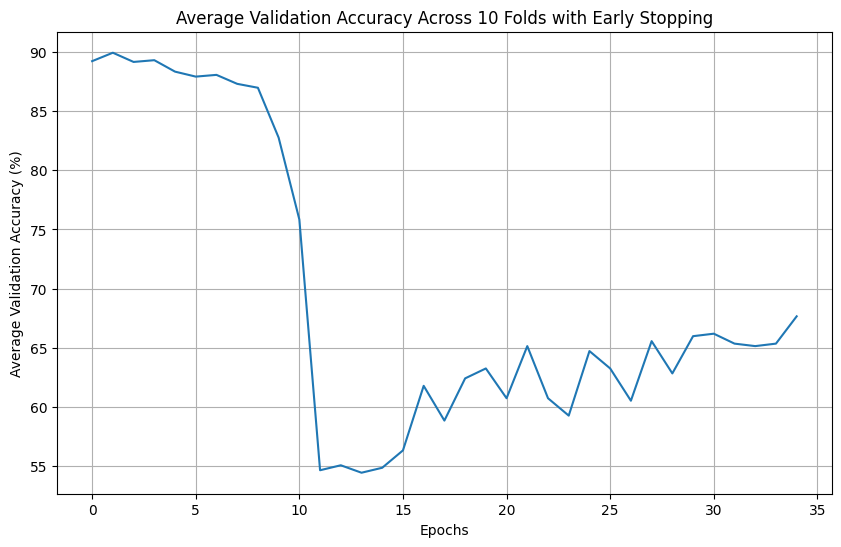


Average Final Validation Accuracy across 10 folds: 88.85%


In [162]:
class EarlyStopping:
    def __init__(self, patience=7, min_delta=0, mode='min'):
        """
        Args:
            patience (int): How many epochs to wait after last time validation loss improved.
                            Default: 7
            min_delta (float): Minimum change in the monitored quantity to qualify as an improvement.
                             Default: 0
            mode (str): One of {'min', 'max'}. In 'min' mode, training will stop when the
                        monitored quantity has stopped decreasing; in 'max' mode it will
                        stop when the monitored quantity has stopped increasing.
                        Default: 'min'
        """
        self.patience = patience
        self.min_delta = min_delta
        self.mode = mode
        self.best_value = float('inf') if mode == 'min' else float('-inf')
        self.counter = 0
        self.early_stop = False

    def __call__(self, current_value):
        if self.mode == 'min':
            if current_value < self.best_value - self.min_delta:
                self.best_value = current_value
                self.counter = 0
            else:
                self.counter += 1
                if self.counter >= self.patience:
                    self.early_stop = True
        elif self.mode == 'max':
            if current_value > self.best_value + self.min_delta:
                self.best_value = current_value
                self.counter = 0
            else:
                self.counter += 1
                if self.counter >= self.patience:
                    self.early_stop = True

        return self.early_stop

def train_with_kfold_earlystopping(model, optimizer, loss_fn, dataset, k_folds, epochs, device, patience=5, min_delta=0.001):
    kfold_splitter = sklearn.model_selection.KFold(n_splits=k_folds, shuffle=True, random_state=42)
    training_records = {}
    fold_count = 0

    for train_idx, val_idx in kfold_splitter.split(np.arange(len(dataset))):
        fold_count += 1
        print(f"*****Fold {fold_count}*****")

        # Creating datasets and data loaders for the current fold with the transform
        train_dataset = torch.utils.data.Subset(dataset, train_idx)
        val_dataset = torch.utils.data.Subset(dataset, val_idx)

        train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True) # Shuffle training data within fold
        val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

        # Resetting the model's trainable parameters (classifier in this case)
        reset_classifier(model) # Assuming reset_classifier function is defined

        # Initialising early stopping for the current fold
        early_stopping = EarlyStopping(patience=patience, min_delta=min_delta, mode='min')

        fold_train_losses = []
        fold_val_losses = []
        fold_val_accuracies = []

        for epoch in range(epochs):
            # Training phase
            model.train()
            running_train_loss = 0.0
            for inputs, labels in tqdm(train_loader, desc=f"Fold {fold_count}, Epoch {epoch+1}/{epochs}"):
                inputs, labels = inputs.to(device), labels.to(device)

                optimizer.zero_grad()
                outputs = model(inputs)
                loss = loss_fn(outputs, labels)
                loss.backward()
                optimizer.step()
                running_train_loss += loss.item() * inputs.size(0)

            epoch_train_loss = running_train_loss / len(train_loader.dataset)
            fold_train_losses.append(epoch_train_loss)

            # Validation phase
            model.eval()
            running_val_loss = 0.0
            correct_val = 0
            total_val = 0
            with torch.no_grad():
                for inputs, labels in val_loader:
                    inputs, labels = inputs.to(device), labels.to(device)
                    outputs = model(inputs)
                    loss = loss_fn(outputs, labels)

                    running_val_loss += loss.item() * inputs.size(0)

                    _, predicted = torch.max(outputs, 1)
                    total_val += labels.size(0)
                    correct_val += (predicted == labels).sum().item()

            epoch_val_loss = running_val_loss / len(val_loader.dataset)
            fold_val_losses.append(epoch_val_loss)
            epoch_val_acc = 100 * correct_val / total_val
            fold_val_accuracies.append(epoch_val_acc)

            print(f"Fold {fold_count}, Epoch {epoch+1}/{epochs}, Train Loss: {epoch_train_loss:.4f}, Val Loss: {epoch_val_loss:.4f}, Val Acc: {epoch_val_acc:.2f}%")

            # Checking for early stopping
            if early_stopping(epoch_val_loss):
                print(f"Early stopping triggered at epoch {epoch+1} for Fold {fold_count}.")
                break # Stop training for this fold

        # Saving training results for graphing for the current fold
        training_records[fold_count] = {
            "train_losses": fold_train_losses,
            "val_losses": fold_val_losses,
            "val_accuracies": fold_val_accuracies,
        }
        print("\n")

    return training_records

# Using the custom model with the original normalized dataset for k-fold cross-validation
# The undersampled dataset is used here as the full dataset for k-fold splitting
k_folds = 10
num_epochs_kfold = 50 # Seting a higher number of epochs as early stopping will handle termination
patience_es = 7 # Patience for early stopping
min_delta_es = 0.001 # Minimum change to be considered an improvement

# Instantiating a new custom model for k-fold cross-validation to ensure a fresh start for each fold
custom_model_kfold = CustomCNN(num_classes=len(norm_dataset.classes)).to(device)
optimizer_kfold = torch.optim.Adam(custom_model_kfold.parameters(), lr=0.0001)
loss_fn_kfold = torch.nn.CrossEntropyLoss()


print(f"Starting K-Fold Cross-Validation with {k_folds} folds and Early Stopping...")
kfold_training_records = train_with_kfold_earlystopping(
    custom_model_kfold,
    optimizer_kfold,
    loss_fn_kfold,
    norm_dataset, # Using the full normalized dataset for k-fold splitting
    k_folds=k_folds,
    epochs=num_epochs_kfold,
    device=device,
    patience=patience_es,
    min_delta=min_delta_es
)

print("\nK-Fold Cross-Validation with Early Stopping Completed.")

# Analysing the results from `kfold_training_records` to understand the model's performance across folds.
# Also plotting the learning curves for each fold and calculating the average performance metrics.

# Plotting average validation accuracy
average_val_accuracies_per_epoch = []
max_epochs_reached = max(len(kfold_training_records[fold]["val_accuracies"]) for fold in kfold_training_records)

for epoch in range(max_epochs_reached):
    epoch_accuracies = [kfold_training_records[fold]["val_accuracies"][epoch] for fold in kfold_training_records if epoch < len(kfold_training_records[fold]["val_accuracies"])]
    if epoch_accuracies:
        average_val_accuracies_per_epoch.append(np.mean(epoch_accuracies))
    else:
        average_val_accuracies.append(np.nan) # This handle cases where some folds stopped early.

plt.figure(figsize=(10, 6))
plt.plot(average_val_accuracies_per_epoch)
plt.xlabel("Epochs")
plt.ylabel("Average Validation Accuracy (%)")
plt.title(f"Average Validation Accuracy Across {k_folds} Folds with Early Stopping")
plt.grid(True)
plt.show()



# Calculating average final validation accuracy across all folds
final_val_accuracies = [kfold_training_records[fold]["val_accuracies"][-1] for fold in kfold_training_records]
average_final_val_accuracy = np.mean(final_val_accuracies)
print(f"\nAverage Final Validation Accuracy across {k_folds} folds: {average_final_val_accuracy:.2f}%")

# The `kfold_training_records` dictionary now contains the training history for each fold.
# Using the history to analyze the variability of performance across different splits of the data.
# Using the hyperparameters that performed best on average across the folds.

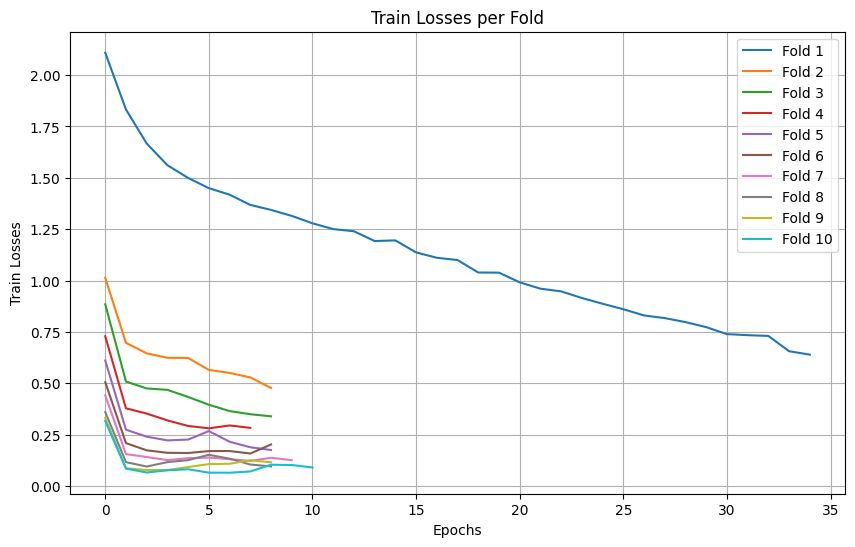

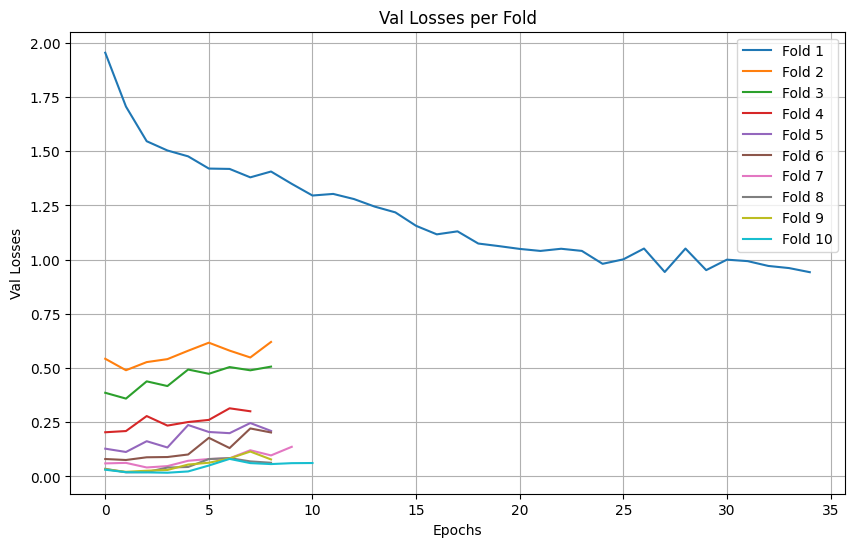

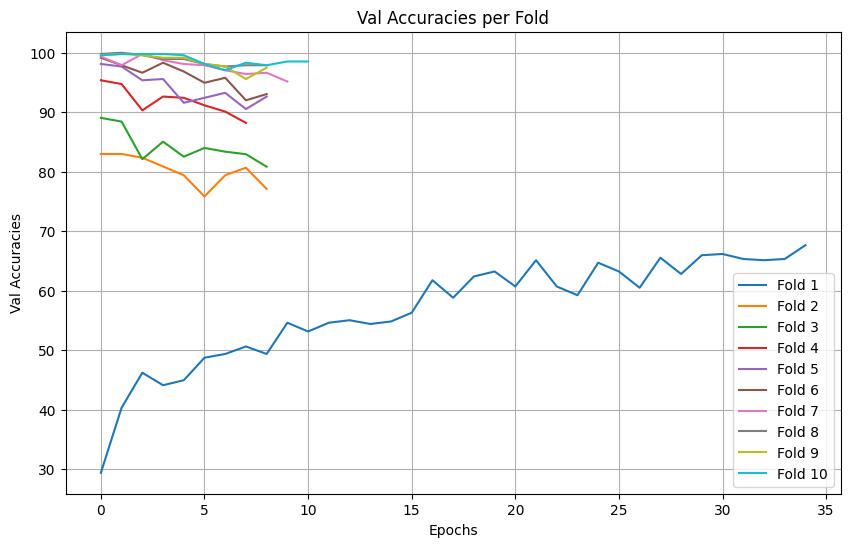

In [163]:
import matplotlib.pyplot as plt
def plot_all_folds(data, measurement):
    plt.figure(figsize=(10, 6))  # Creating a new figure for each plot type
    for fold in data.keys():
        plt.plot(data[fold][measurement], label=f"Fold {fold}")
    plt.xlabel("Epochs")
    plt.ylabel(measurement.replace('_', ' ').title()) # Improve y-axis label
    plt.title(f"{measurement.replace('_', ' ').title()} per Fold") # Add title
    plt.legend()
    plt.grid(True) # Add grid
    plt.show() # Display the plot

# Plotting the training losses for all folds
plot_all_folds(kfold_training_records, "train_losses")

# Plotting the validation losses for all folds
plot_all_folds(kfold_training_records, "val_losses")

# Plotting the validation accuracies for all folds
plot_all_folds(kfold_training_records, "val_accuracies")

Creating Confusion Matrix and evaluating the model

Evaluating the custom model on the validation set...


Evaluating: 100%|██████████| 15/15 [00:04<00:00,  3.54it/s]



Classification Report (Custom CNN):
                     precision    recall  f1-score   support

          Cardboard       1.00      1.00      1.00        33
      Food Organics       0.98      1.00      0.99        47
              Glass       1.00      1.00      1.00        44
              Metal       1.00      0.96      0.98        75
Miscellaneous Trash       0.95      0.98      0.96        42
              Paper       0.98      1.00      0.99        60
            Plastic       0.98      0.98      0.98       103
      Textile Trash       0.96      0.96      0.96        28
         Vegetation       1.00      1.00      1.00        43

           accuracy                           0.99       475
          macro avg       0.98      0.99      0.99       475
       weighted avg       0.99      0.99      0.99       475



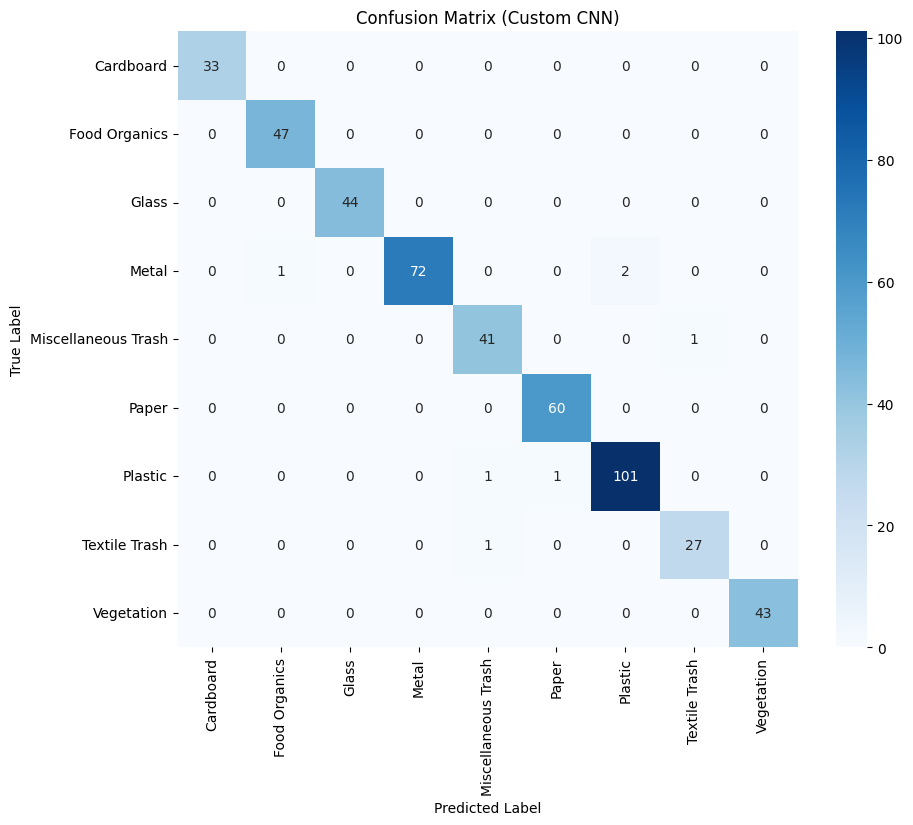

In [164]:
# Evaluating the model on the validation set and generate confusion matrix

import matplotlib.pyplot as plt
from sklearn.metrics import classification_report, confusion_matrix
import seaborn as sns

# Evaluating the model on the validation set and generate confusion matrix
print("Evaluating the custom model on the validation set...")
custom_model_kfold.eval()
all_predictions = []
all_true_labels = []

with torch.no_grad():
    for inputs, labels in tqdm(val_loader, desc="Evaluating"):
        inputs, labels = inputs.to(device), labels.to(device)
        outputs = custom_model_kfold(inputs)
        _, predicted = torch.max(outputs, 1)
        all_predictions.extend(predicted.cpu().numpy())
        all_true_labels.extend(labels.cpu().numpy())

# Getting the target names from the dataset used for evaluation (val_dataset)
# Assuming val_dataset uses the same class mapping as norm_dataset
target_names = norm_dataset.classes
# Generating classification report
print("\nClassification Report (Custom CNN):")
print(classification_report(all_true_labels, all_predictions, target_names=target_names))
# Generating confusion matrix
conf_matrix = confusion_matrix(all_true_labels, all_predictions)

# Plotting the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=target_names, yticklabels=target_names)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix (Custom CNN)')
plt.show()

In [165]:
print("\nSummary of the Custom CNN model:")
# Re-using the test_batch from the undersampled_train_loader for input size
summary(custom_model_kfold, input_size=test_batch.shape)


Summary of the Custom CNN model:


Layer (type:depth-idx)                             Output Shape              Param #
CustomCNN                                          [32, 9]                   --
├─Sequential: 1-1                                  [32, 960, 7, 7]           --
│    └─Sequential: 2-1                             [32, 24, 112, 112]        --
│    │    └─Conv2d: 3-1                            [32, 24, 112, 112]        648
│    │    └─BatchNorm2d: 3-2                       [32, 24, 112, 112]        48
│    │    └─ReLU6: 3-3                             [32, 24, 112, 112]        --
│    └─InvertedResidualBlock: 2-2                  [32, 12, 112, 112]        --
│    │    └─Sequential: 3-4                        [32, 12, 112, 112]        576
│    │    └─SqueezeExcitation: 3-5                 [32, 12, 112, 112]        --
│    └─InvertedResidualBlock: 2-3                  [32, 18, 56, 56]          --
│    │    └─Sequential: 3-6                        [32, 18, 56, 56]          3,132
│    │    └─CBAM: 3-7         

Measuring time inference of the model

In [166]:
# Ensuring the model is on the correct device and in evaluation mode
custom_model_kfold.to(device)
custom_model_kfold.eval()

# Getting a batch of data from the validation loader
data_iter = iter(val_loader)
inputs, labels = next(data_iter)
inputs = inputs.to(device)

# Measuring inference time
if device == 'cuda':
    start_event = torch.cuda.Event(enable_timing=True)
    end_event = torch.cuda.Event(enable_timing=True)

    start_event.record()
    with torch.no_grad():
        outputs = custom_model_kfold(inputs)
    end_event.record()

    # Waiting for the events to complete
    torch.cuda.synchronize()

    # Calculating the elapsed time
    inference_time_ms = start_event.elapsed_time(end_event) # Time in milliseconds
    print(f"Inference time for a batch ({inputs.size(0)} images) on {device}: {inference_time_ms:.4f} ms")
    print(f"Average inference time per image: {inference_time_ms / inputs.size(0):.4f} ms")

else: # CPU inference
    start_time = time.time()
    with torch.no_grad():
        outputs = custom_model_kfold(inputs)
    end_time = time.time()

    inference_time_sec = end_time - start_time # Time in seconds
    print(f"Inference time for a batch ({inputs.size(0)} images) on {device}: {inference_time_sec:.4f} seconds")
    print(f"Average inference time per image: {inference_time_sec / inputs.size(0):.4f} seconds")


# Calculating memory usage of the model and requirements for deployability
# This will give an estimate of the memory used by the model's parameters and buffers.
# It does not include the memory used by the inputs or intermediate activations during inference.
param_size = 0
for param in custom_model_kfold.parameters():
    param_size += param.nelement() * param.element_size()
buffer_size = 0
for buffer in custom_model_kfold.buffers():
    buffer_size += buffer.nelement() * buffer.element_size()

model_memory_bytes = param_size + buffer_size
model_memory_mb = model_memory_bytes / (1024**2)

print(f"\nEstimated model memory usage: {model_memory_mb:.2f} MB")


# Requirements for deployability

print("\nRequirements for Deployability:")
print("- Model size: The estimated memory usage of the model is approximately", f"{model_memory_mb:.2f} MB", ". This is a key factor for deployment, especially on devices with limited memory (e.g., mobile or edge devices).")
print("- Computational resources: The model is a lightweight CNN. The measured inference time on the available hardware gives an indication of the required processing speed.")
if device == 'cuda':
    print(f"  - Inference time per image on {device}: {inference_time_ms / inputs.size(0):.4f} ms")
else:
     print(f"  - Inference time per image on {device}: {inference_time_sec / inputs.size(0):.4f} seconds")
print("- Software dependencies: The deployed environment will need to have Python, PyTorch, and other libraries used (e.g., torchvision, numpy, sklearn, PIL) installed.")
print("- Hardware acceleration: Access to hardware acceleration (like GPUs, TPUs, or specialized AI chips) can significantly improve performance.")
print("- Input preprocessing: The deployed model will require inputs to be preprocessed in the same way as during training, including resizing to 244x244, converting to a tensor, and normalizing using the calculated mean and standard deviation.")
print(f"  - Image size: 224x224 pixels")
# Assuming mean and std are calculated earlier in the notebook and are accessible
print(f"  - Normalization Mean: {mean.tolist()}") # Assuming mean is a tensor
print(f"  - Normalization Std Dev: {std.tolist()}") # Assuming std is a tensor
print("- Output interpretation: The model outputs probabilities for 9 classes. The deployment code will need to map these probabilities/predictions back to the original class names: ", norm_dataset.classes) # Use norm_dataset for class names
print("- Platform: The specific deployment platform (e.g., server, cloud, mobile, edge device) will influence the required libraries, hardware, and optimization techniques (like quantization or model pruning).")


Inference time for a batch (32 images) on cuda: 35.7063 ms
Average inference time per image: 1.1158 ms

Estimated model memory usage: 6.63 MB

Requirements for Deployability:
- Model size: The estimated memory usage of the model is approximately 6.63 MB . This is a key factor for deployment, especially on devices with limited memory (e.g., mobile or edge devices).
- Computational resources: The model is a lightweight CNN. The measured inference time on the available hardware gives an indication of the required processing speed.
  - Inference time per image on cuda: 1.1158 ms
- Software dependencies: The deployed environment will need to have Python, PyTorch, and other libraries used (e.g., torchvision, numpy, sklearn, PIL) installed.
- Hardware acceleration: Access to hardware acceleration (like GPUs, TPUs, or specialized AI chips) can significantly improve performance.
- Input preprocessing: The deployed model will require inputs to be preprocessed in the same way as during training, 

Identifying and analysing Images that were misclassified by the Custom model


Found 7 misclassified images.

Displaying the first 7 misclassified images:


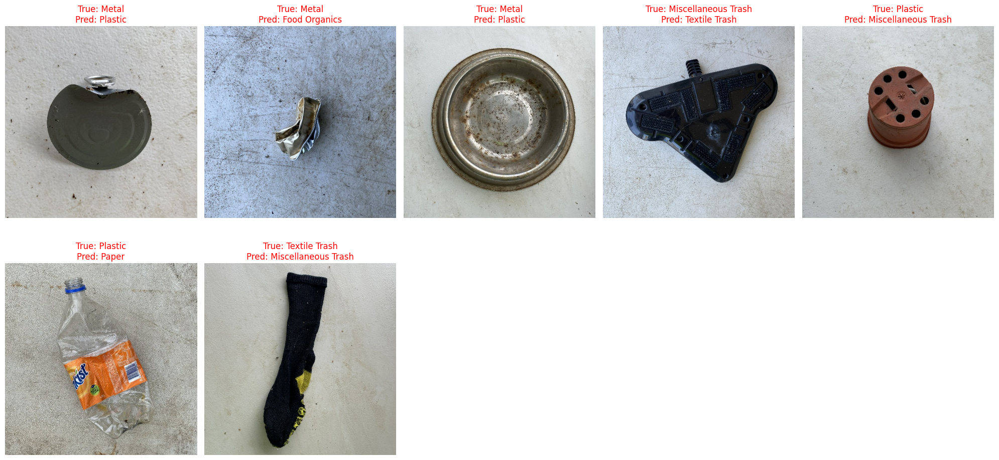

In [167]:

# Identifying misclassified images
misclassified_indices = [i for i in range(len(all_true_labels)) if all_true_labels[i] != all_predictions[i]]
print(f"\nFound {len(misclassified_indices)} misclassified images.")

# Getting the actual image paths for the misclassified samples
# Need to map the index in the val_dataset subset back to the original dataset index
original_indices_misclassified = [val_dataset.indices[i] for i in misclassified_indices]
misclassified_image_paths = [norm_dataset.imgs[idx][0] for idx in original_indices_misclassified]
misclassified_true_labels = [norm_dataset.classes[norm_dataset.imgs[idx][1]] for idx in original_indices_misclassified]
misclassified_predicted_labels = [norm_dataset.classes[all_predictions[i]] for i in misclassified_indices]

# Displaying some misclassified images
num_images_to_display = 10 # Adjust as needed
print(f"\nDisplaying the first {min(num_images_to_display, len(misclassified_indices))} misclassified images:")

plt.figure(figsize=(20, 10))
for i in range(min(num_images_to_display, len(misclassified_indices))):
    img_path = misclassified_image_paths[i]
    true_label = misclassified_true_labels[i]
    predicted_label = misclassified_predicted_labels[i]

    img = PIL.Image.open(img_path)

    plt.subplot(2, (num_images_to_display + 1) // 2, i + 1) # Adjust subplot grid
    plt.imshow(img)
    plt.title(f"True: {true_label}\nPred: {predicted_label}", color='red')
    plt.axis('off')

plt.tight_layout()
plt.show()


Saving the model

In [168]:
# save the custom CNN Model

torch.save(custom_model_kfold.state_dict(), 'waste_classification_custom_model.pth')
print("Custom model saved as waste_classification_custom_model.pth")


Custom model saved as waste_classification_custom_model.pth


#The End, Thank you!!!